# 12/18/2020 | CNV002: analyzing Pu's data

The idea is to look at Pu's existing data to see how well the current algorithm is able to count the number of copies. Below is the email I got from him:

    Hi Leonardo,

    Sure. The data for my chr21 whole chromosome is in:
    
    \\smirnov\Chromatin_NAS_2\20190627_IMR90_CTP05_DNA
    smirnov is my NAS which has a common user account：
    username: chromatin
    password: chromosome21
    
    each subfolder contains one round of imaging, within each image, the first and last 10 frames are for calibration, so please discard them. The rest are images for z-stacks, except H0R0 has DAPI (405), the rest are in 4 colors. Please have a look of the file ./Analysis/Color_Usage.csv for more information.

I then asked about the code he used for spot fitting, here is his response: 

    Hi Leonardo,
    Yes, please have a look in my Github repo.
    This is the file contain fiting program itself, written by Bogdan and I converted it into python3:
    
    https://github.com/zhengpuas47/ImageAnalysis3/blob/master/External/Fitting_v4.py
    
    The function that I called this program is in file:
    
    https://github.com/zhengpuas47/ImageAnalysis3/blob/master/spot_tools/fitting.py
    
    the function fit_fov_image is what I did to a 3d image (which could be any size, which is basically what you could load from dax file)

    Best,
    Pu

First, I will load some of his images into the notebook to have an idea of how the data looks like. Mapped Pu's directory:

    \\smirnov\Chromatin_NAS_2\20190627_IMR90_CTP05_DNA ->  W:20190627_IMR90_CTP05_DNA
    
I am using the updated python 3 enviroment (after conda update --all)

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib notebook

In [2]:
# setup environmental variables in windows
import os
import sys
env_p = sys.prefix  # path to the env
print("Env. path: {}".format(env_p))
new_p = ''
for extra_p in (r"Library\mingw-w64\bin",
    r"Library\usr\bin",
    r"Library\bin",
    r"Scripts",
    r"bin"):
    new_p +=  os.path.join(env_p, extra_p) + ';'
os.environ["PATH"] = new_p + os.environ["PATH"]  # set it for Python
os.putenv("PATH", os.environ["PATH"])  # push it at the OS level

# core libraries
import re
import random
import time
import math
import numpy as np
import pandas as pd

# statistics libraries
# import statistics as st
# from scipy.stats import pearsonr

# datatype libraries
# from collections import Counter
# from collections import defaultdict 
import pickle

# plotting libraries
# import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
# from mpl_toolkits.axes_grid1 import make_axes_locatable
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# from mpl_toolkits.axes_grid1.inset_locator import InsetPosition
# from mpl_toolkits.axes_grid1.inset_locator import mark_inset

# image / segmentation libraries
from PIL import Image
from PIL import ImageColor
Image.MAX_IMAGE_PIXELS = None
import cv2
# from cellpose import utils
from cellpose import models
# from skimage import transform
from skimage import morphology
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

# I/O libraries
from pathlib import Path

# Machine learning libraries
# from sklearn import preprocessing 
# from sklearn.metrics import silhouette_samples
# from sklearn.neural_network import MLPClassifier
# from sklearn.metrics import roc_auc_score
# from sklearn.model_selection import train_test_split
# from sklearn.ensemble import RandomForestClassifier

# # single cell analysis libraries
# import scanpy as sc
# import scanpy.external as sce
# sc.settings.verbosity = 2             # verbosity: errors (0), warnings (1), info (2), hints (3)
# sc.logging.print_header()

# read my own libraries
sys.path.insert(0,'C:/Software/python-functions/')
import systemChecks as syschk # backupNotebook
import imagedisplay as imdis 
import datareader as dr # readdax

# notebook appearenace
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

Env. path: C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121


In [3]:
syschk.backupNotebook(destination='C:/Software/python-notebooks-backup')

In [4]:
expName = 'CNV002'
expDate = '201218'

In [5]:
remoteFolder = 'w:/20190627_IMR90_CTP05_DNA/'

In [6]:
remakeFigures = True 

Lets look at the data. Organization, first, let's see how many regions are there:

In [7]:
regionPositionsDF = pd.read_csv(f'{remoteFolder}Analysis/Region_Positions.csv',nrows=651)
regionPositionsDF

,region,chr,start,end,midpoint
0,1,chr21,10400001,10450001,10425001
1,2,chr21,10500001,10550001,10525001
2,3,chr21,10600001,10650001,10625001
3,4,chr21,13250001,13300001,13275001
4,5,chr21,14000001,14050001,14025001
...,...,...,...,...,...
646,647,chr21,46450001,46500001,46475001
647,648,chr21,46500001,46550001,46525001
648,649,chr21,46550001,46600001,46575001
649,650,chr21,46600001,46650001,46625001


Ok there are 651 regions. Now let's look at the information for each folder

In [8]:
colorUsageDF = pd.read_csv(f'{remoteFolder}Analysis/Color_Usage.csv')
colorUsageDF

,Hyb,750,647,561,488,405
0,H0R0,NaN,NaN,NaN,beads,DAPI
1,H1R1,u369,u370,u368,beads,NaN
2,H2R2,u372,u373,u371,beads,NaN
3,H3R3,u376,u374,u375,beads,NaN
4,H4R4,u379,u377,u378,beads,NaN
...,...,...,...,...,...,...
250,H257R257,NaN,NaN,NaN,beads,NaN
251,H258R258,NaN,NaN,NaN,beads,NaN
252,H259R259,NaN,NaN,NaN,beads,NaN
253,H260R260,NaN,NaN,NaN,beads,NaN


There are 255 rounds of hybridization. H0R0 has the DAPI information, all the others have the chromosome regions. 

Let's see one FOV for the dapi channel (H0R0)

In [9]:
fov = 0
folderName = 'H0R0'
fileName = f'Conv_zscan_{fov:02.0f}.dax'
filePath = f'{remoteFolder}{folderName}/{fileName}'
imageStack = dr.DaxReader(filePath)

In [10]:
print(f'image_height : {imageStack.image_height}')
print(f'image_width  : {imageStack.image_width}')
print(f'number_frames: {imageStack.number_frames}')

image_height : 2048
image_width  : 2048
number_frames: 170


let's look at the whole image

<IPython.core.display.Javascript object>


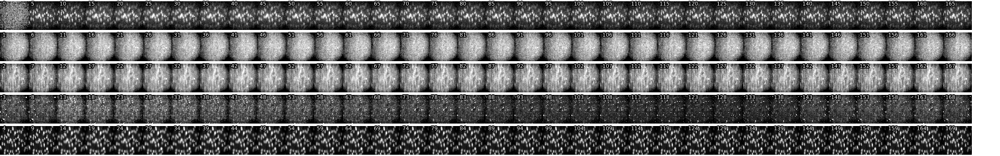

In [11]:
fig, ax = plt.subplots(ncols=35, nrows=5, figsize=(16,2.5), sharex=True, sharey=True)
# ax = np.ravel(ax)
for row in range(5):
    for col in range(35):
        frame = col*5 + row
        if frame > 169:
            ax[row,col].axis('off')
        else:
            im = Image.fromarray(imageStack.loadAFrame(frame))
            im = im.resize((64,64),resample=0)

            vmin, vmax = imdis.getImageValueRange(im,5,99)

            ax[row,col].imshow(im, vmin=vmin, vmax=vmax, cmap='gray')
            ax[row,col].axis('off')
            txt = ax[row,col].text(5,5,f'{frame}',va='center',ha='left',c='w',fontsize=6)
            txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k')])
    
fig.tight_layout(pad=0,w_pad=0,h_pad=0)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_01_{expDate}.png')

ok, 34 z-positions. Let's see how the dapi images (channel 5, 4,9,14 ...,169) look like

<IPython.core.display.Javascript object>


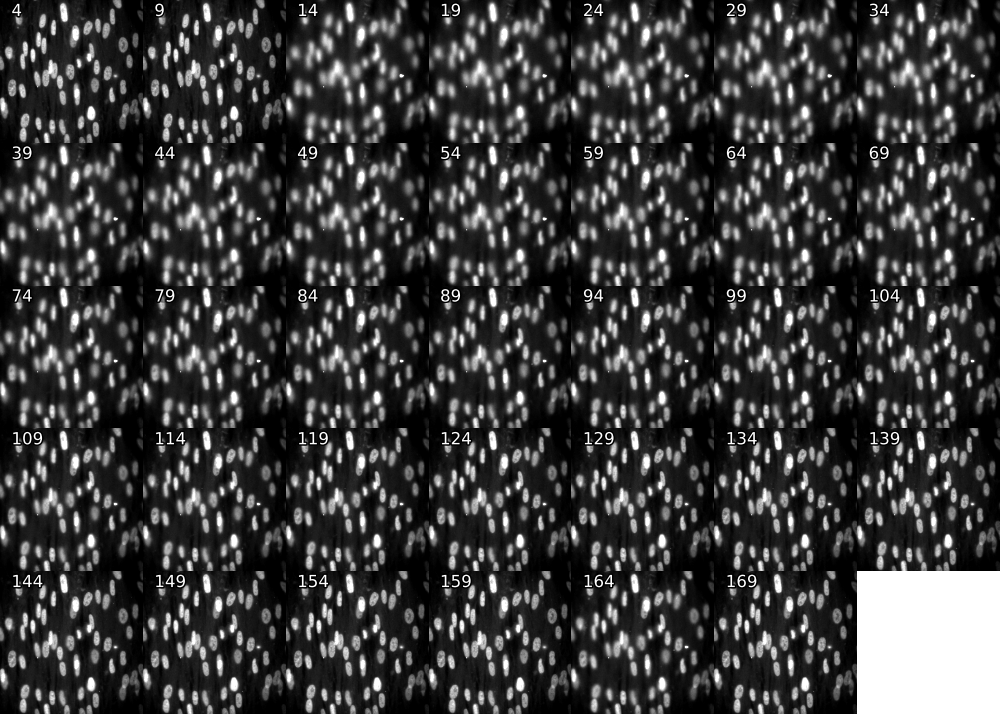

In [12]:
ncols = 7
nrows = 5
xfigsize = 10
yfigsize = xfigsize*(nrows/ncols)
fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(xfigsize,yfigsize), sharex=True, sharey=True)

ax = np.ravel(ax)

counter = 0
for frame in range(4,170,5):
    if frame > 169:
        ax[counter].axis('off')
    else:
        im = Image.fromarray(imageStack.loadAFrame(frame))
        im = im.resize((256,256),resample=0)

        vmin, vmax = imdis.getImageValueRange(im,5,99)

        ax[counter].imshow(im, vmin=vmin, vmax=vmax, cmap='gray')
        ax[counter].axis('off')
        txt = ax[counter].text(20,20,f'{frame}',va='center',ha='left',c='w',fontsize=12)
        txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k')])
    counter+=1
    
ax[34].axis('off')
fig.tight_layout(pad=0,w_pad=0,h_pad=0)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_02_{expDate}.png')

as Pu said, the first 10 frames are for calibrarion, so are not necesary. Let's now try to scroll over the stack. 

In [13]:
# read all images into a list|
imageListDapi = []
for frame in range(14,170,5):
    imageListDapi.append( Image.fromarray(imageStack.loadAFrame(frame)) )

<IPython.core.display.Javascript object>


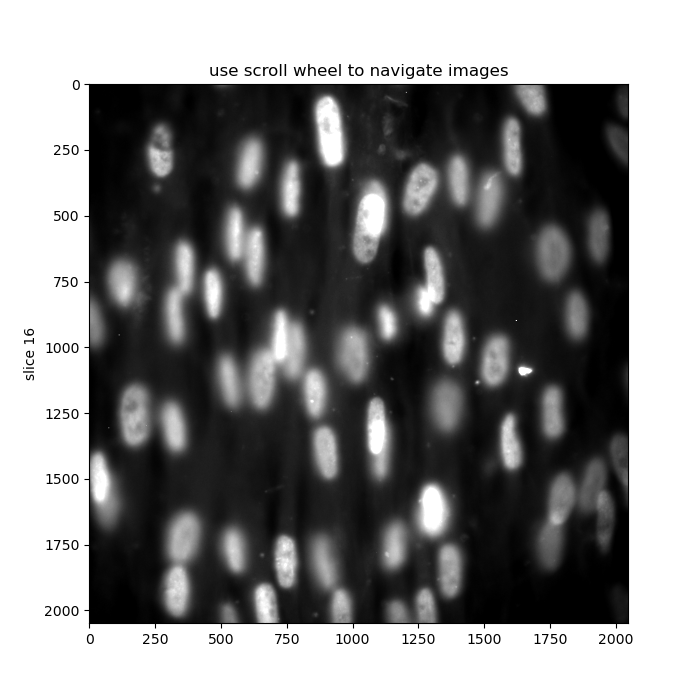

In [14]:
fig, ax = plt.subplots(ncols = 1, nrows = 1,figsize=(7,7)) 
tracker = imdis.singleImageScroller(ax, imageListDapi)
fig.canvas.mpl_connect('scroll_event', tracker.onscroll)
plt.show()

The last image seems to be off somehow, I wont use them. Anyway, I think this images should be very amenable to 3D segmentation using cellpose. As input, I need an array of the size frames x Xpos x Ypos.

# Segmentation of DAPI images using cellpose

In [15]:
frames = list(range(14,160,5))
dapiStack = np.zeros((len(frames),2048,2048))
counter = 0
for i in frames:
    dapiStack[counter,:,:] = Image.fromarray(imageStack.loadAFrame(i))
    counter+=1

In [16]:
pickleName = 'cellpose_dapi_3d.pkl' 
if Path(pickleName).is_file():
    print(f'reading {pickleName} ...')
    with open(pickleName,'rb') as f: 
        masks, flows, styles, diams = pickle.load(f)
else:
    startTime = time.time()
    channels = [0,0]
    model = models.Cellpose(gpu=False, model_type='nuclei')
    masks, flows, styles, diams = model.eval(dapiStack, diameter=50, channels=channels, do_3D=True)
    endTime = (time.time() - startTime) / 60
    print('3D segmentation: {:.1f} min'.format(endTime))

    # Saving the objects:
    with open(pickleName, 'wb') as f: 
        pickle.dump([masks, flows, styles, diams], f)

reading cellpose_dapi_3d.pkl ...


Ok, let's get now the overlap between the masks and the images

In [17]:
imageListDapi = []
for z in range(dapiStack.shape[0]):
    print(f'z = {z}',end='\r')
    outlineDapi = imdis.getMaskBoundaries(masks[z].squeeze())
    outlineDapi = morphology.dilation(outlineDapi,morphology.selem.disk(1))

    imageChannels = np.stack([dapiStack[z,:,:], outlineDapi.astype(int)])
    channelColors = np.array([[1, 1, 1], [1, 0, 0]])
    dapiOverlay = imdis.getImageOverlay(imageChannels, channelColors,5,99)
    imageListDapi.append(dapiOverlay)

<IPython.core.display.Javascript object>


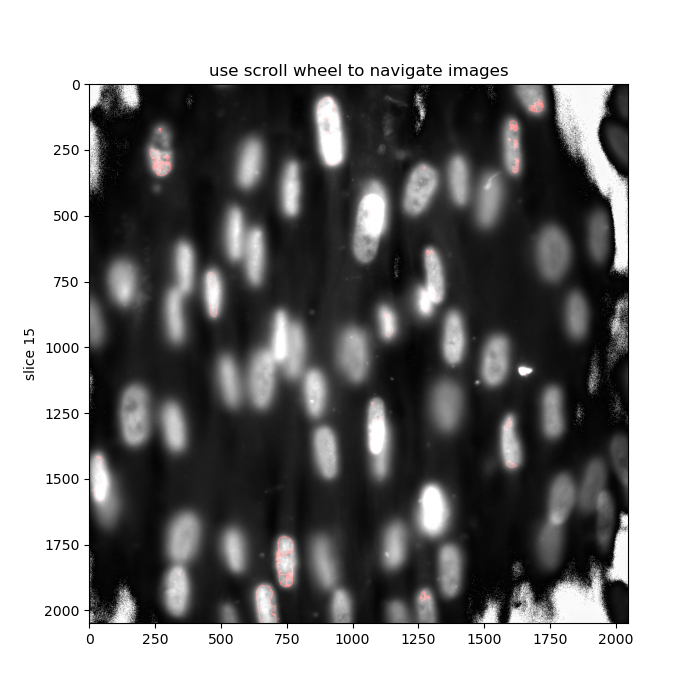

In [18]:
fig, ax = plt.subplots(ncols = 1, nrows = 1,figsize=(7,7)) 
tracker = imdis.singleImageScroller(ax, imageListDapi)
fig.canvas.mpl_connect('scroll_event', tracker.onscroll)
plt.show()

As is , very bad results. Let's now perform 2D segmentation, and try different parameters. I will use a single z plane to vcheck, z = 124

<IPython.core.display.Javascript object>


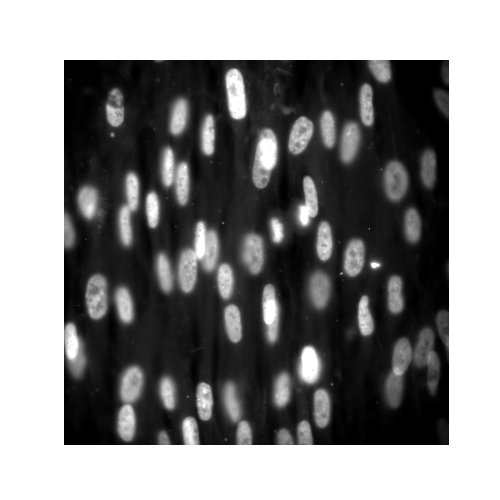

(-0.5, 2047.5, 2047.5, -0.5)

In [19]:
fig,ax = plt.subplots(nrows=1,ncols=1,figsize=(5,5)) 
I = imageStack.loadAFrame(124)
vmin, vmax = imdis.getImageValueRange(I,5,99)
ax.imshow(I,vmin=vmin, vmax=vmax, cmap='gray')
ax.axis('off')

In [20]:
pickleName = 'cellpose_test_1.pkl' 
if Path(pickleName).is_file():
    print(f'reading {pickleName} ...')
    with open(pickleName,'rb') as f: 
        overlayList = pickle.load(f)
else:
    I = imageStack.loadAFrame(124)
    I = I[512:1560,512:1560]
    diameters = [30, 50, 80, 100, 150, 200]
    channels = [0,0]
    overlayList = []
    for d in range(len(diameters)):
        print(f'{d}. Using diameter = {diameters[d]}')
        model_nuclei = models.Cellpose(gpu=False, model_type='nuclei')
        masks_nuclei, flows_nuclei, styles_nuclei, diams_nuclei = model_nuclei.eval(I, channels=channels,diameter=diameters[d])

        model_cyto = models.Cellpose(gpu=False, model_type='cyto')
        masks_cyto, flows_cyto, styles_cyto, diams_cyto = model_cyto.eval(I, channels=channels,diameter=diameters[d])

        outlineDapiNuclei = imdis.getMaskBoundaries(masks_nuclei)
        outlineDapiNuclei = morphology.dilation(outlineDapiNuclei,morphology.selem.disk(1))

        outlineDapiCyto = imdis.getMaskBoundaries(masks_cyto)
        outlineDapiCyto = morphology.dilation(outlineDapiCyto,morphology.selem.disk(1))

        imageChannels = np.stack([I, outlineDapiNuclei.astype(int), outlineDapiCyto.astype(int)])
        channelColors = np.array([[1, 1, 1], [1, 0, 0],[0, 1, 0]])
        overlayList.append( imdis.getImageMaskOverlay(imageChannels, channelColors,['image','mask', 'mask'],5,99))
    
    # Saving the objects:
    with open(pickleName, 'wb') as f: 
        pickle.dump([overlayList], f)

reading cellpose_test_1.pkl ...


<IPython.core.display.Javascript object>


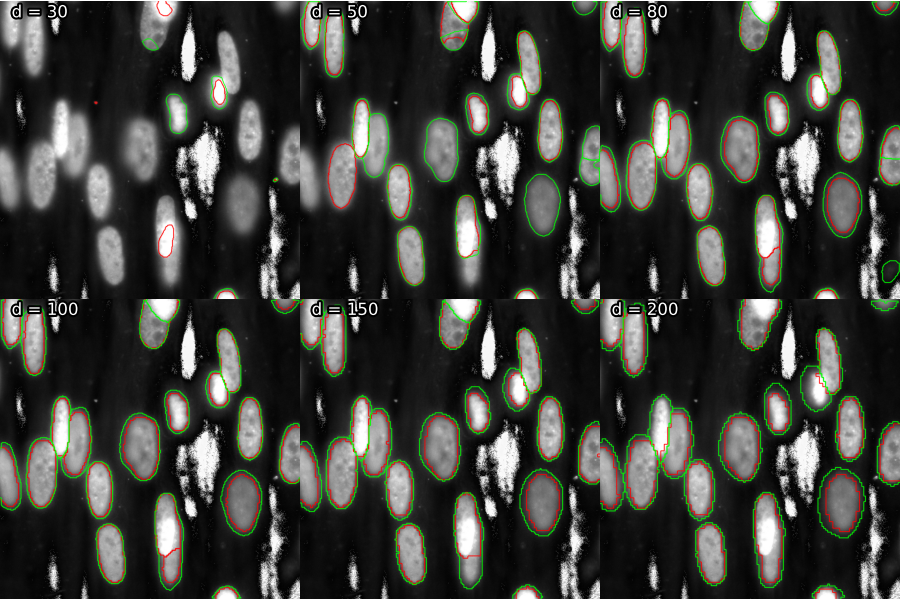

In [22]:
diameters = [30, 50, 80, 100, 150, 200]
fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(9,6),sharex=True,sharey=True)
ax=np.ravel(ax)
for d in range(len(overlayList[0])):
    ax[d].imshow(overlayList[0][d])
    ax[d].axis('off')
    txt = ax[d].text(40,40,f'd = {diameters[d]}',va='center',ha='left',c='w',fontsize=12)
    txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='k')])
fig.tight_layout(pad=0,w_pad=0,h_pad=0)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_03_{expDate}.png')

The cyto model (green) gives masks that look a little larger. I would say that the diameter parameter that look best is ~80. Ok, let's see the whole  

In [23]:
frames = list(range(14,160,5))
imageList = []
for i in frames:
    I = imageStack.loadAFrame(i)
    imageList.append( I[512:1536,512:1536] )

In [24]:
pickleName = 'cellpose_test_2.pkl' 
if Path(pickleName).is_file():
    print(f'reading {pickleName} ...')
    with open(pickleName,'rb') as f: 
        masks = pickle.load(f)
else:
    model = models.Cellpose(gpu=False, model_type='cyto')
    masks, flows, styles, diams = model.eval(imageList, channels=channels,diameter=80)      
    
    # Saving the objects:
    with open(pickleName, 'wb') as f: 
        pickle.dump(masks, f)    

reading cellpose_test_2.pkl ...


<IPython.core.display.Javascript object>


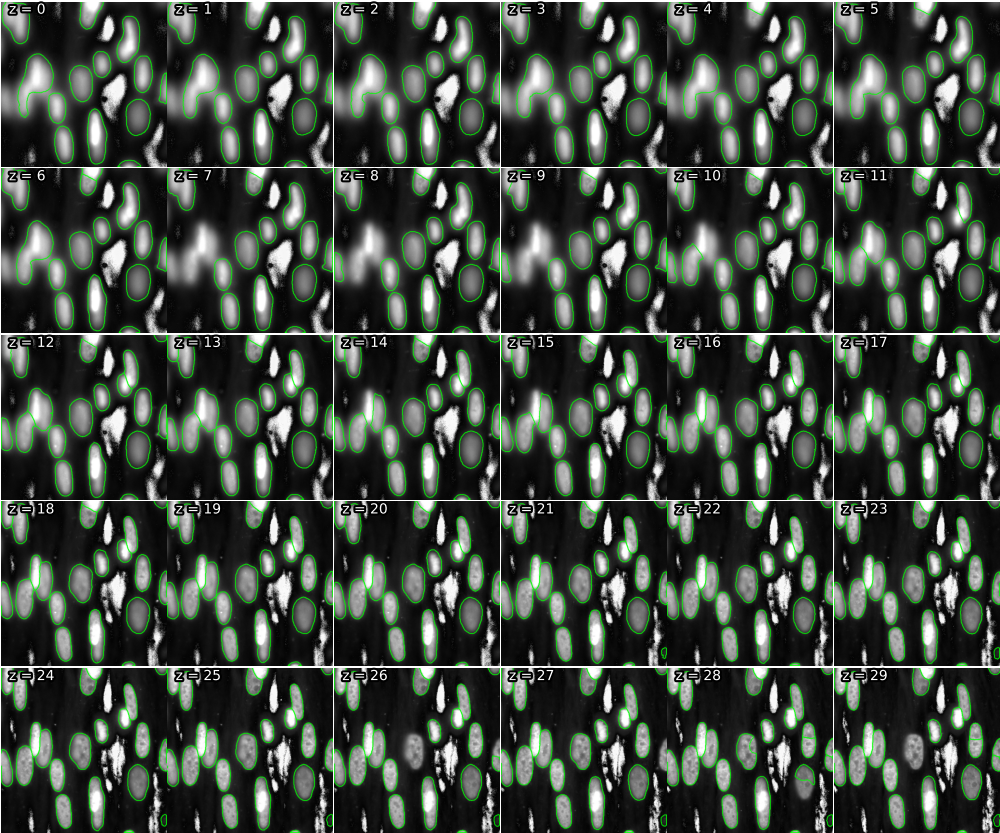

In [25]:
overlay = []
for i in range(len(imageList)):
    outline = imdis.getMaskBoundaries(masks[i])
    outline = morphology.dilation(outline,morphology.selem.disk(2))
    imageChannels = np.stack([imageList[i], outline.astype(int)])
    channelColors = np.array([[1, 1, 1], [0, 1, 0]])
    overlay.append( imdis.getImageMaskOverlay(imageChannels, channelColors,['image','mask'],5,99))

ncols = 6
nrows = 5
xfigsize = 10
yfigsize = xfigsize*(nrows/ncols)
fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(xfigsize,yfigsize), sharex=True, sharey=True)
ax = np.ravel(ax)

counter = 0
for i in range(len(overlay)):
    ax[i].imshow(overlay[i])
    ax[i].axis('off')
    txt = ax[i].text(50,50,f'z = {i}',va='center',ha='left',c='w',fontsize=10)
    txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='k')])
    
fig.tight_layout(pad=0,w_pad=0,h_pad=0)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_04_{expDate}.png')

ok, there are some pretty simple cells that are missing. Let's see if 3D segmentation gives better results. 

In [26]:
frames = list(range(14,160,5))
dapiStack = np.zeros((len(frames),1024,1024))
counter = 0
for i in frames:
    I = imageStack.loadAFrame(i)
    dapiStack[counter,:,:] = I[512:1536,512:1536]
    counter+=1

pickleName = 'cellpose_test_3.pkl' 
if Path(pickleName).is_file():
    with open(pickleName,'rb') as f: 
        masks = pickle.load(f)
else:
    model = models.Cellpose(gpu=False, model_type='cyto')
    masks, flows, styles, diams = model.eval(dapiStack, channels=channels,anisotropy=3,diameter=80, do_3D=True)      
    
    # Saving the objects:
    with open(pickleName, 'wb') as f: 
        pickle.dump(masks, f)    

<IPython.core.display.Javascript object>


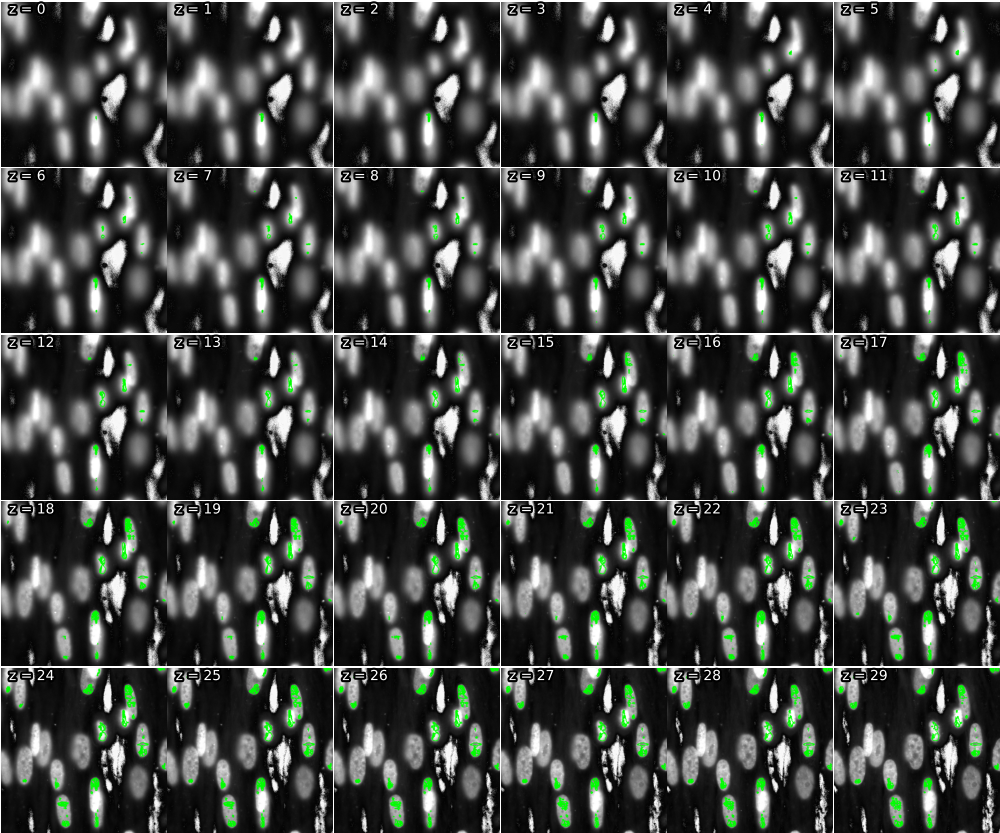

In [27]:
overlay = []
for z in range(dapiStack.shape[0]):
    print(f'z = {z}',end='\r')
    outline = imdis.getMaskBoundaries(masks[z].squeeze())
    outline = morphology.dilation(outline,morphology.selem.disk(2))

    imageChannels = np.stack([dapiStack[z,:,:], outline.astype(int)])
    channelColors = np.array([[1, 1, 1], [0, 1, 0]])
    overlay.append(imdis.getImageMaskOverlay(imageChannels, channelColors,['image','mask'],5,99))

ncols = 6
nrows = 5
xfigsize = 10
yfigsize = xfigsize*(nrows/ncols)
fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(xfigsize,yfigsize), sharex=True, sharey=True)
ax = np.ravel(ax)

counter = 0
for i in range(len(overlay)):
    ax[i].imshow(overlay[i])
    ax[i].axis('off')
    txt = ax[i].text(50,50,f'z = {i}',va='center',ha='left',c='w',fontsize=10)
    txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='k')])
    
fig.tight_layout(pad=0,w_pad=0,h_pad=0)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_05_{expDate}.png')

Ok, clearly something is not working well. Let's move on for now to the spot fitting.

# Spot Fitting. 

firtst, let's look at the three channels for a image that has only spots.

In [28]:
fov = 0
folderName = 'H1R1'
fileName = f'Conv_zscan_{fov:02.0f}.dax'
filePath = f'{remoteFolder}{folderName}/{fileName}'
imageStack = dr.DaxReader(filePath)

print(f'image_height : {imageStack.image_height}')
print(f'image_width  : {imageStack.image_width}')
print(f'number_frames: {imageStack.number_frames}')

image_height : 2048
image_width  : 2048
number_frames: 140


<IPython.core.display.Javascript object>


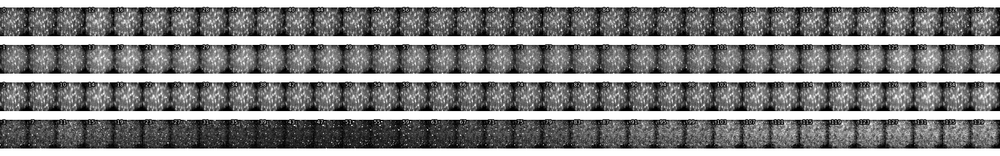

In [29]:
ncols=35
nrows= 4

fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(16,2.5), sharex=True, sharey=True)
for row in range(nrows):
    for col in range(ncols):
        frame = col*nrows + row
        
        if frame < 140:
            im = Image.fromarray(imageStack.loadAFrame(frame))
            im = im.resize((64,64),resample=0)

            vmin, vmax = imdis.getImageValueRange(im,5,99)

            ax[row,col].imshow(im, vmin=vmin, vmax=vmax, cmap='gray')
            ax[row,col].axis('off')
            txt = ax[row,col].text(5,5,f'{frame}',va='center',ha='left',c='w',fontsize=6)
            txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k')])
    
fig.tight_layout(pad=0,w_pad=0,h_pad=0)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_06_{expDate}.png')

In [30]:
a = list(range(12,132,4))
b = list(range(13,133,4))
c = list(range(10,130,4))
d = list(range(11,131,4))
print(a)
print(b)
print(c)
print(d)

[12, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52, 56, 60, 64, 68, 72, 76, 80, 84, 88, 92, 96, 100, 104, 108, 112, 116, 120, 124, 128]
[13, 17, 21, 25, 29, 33, 37, 41, 45, 49, 53, 57, 61, 65, 69, 73, 77, 81, 85, 89, 93, 97, 101, 105, 109, 113, 117, 121, 125, 129]
[10, 14, 18, 22, 26, 30, 34, 38, 42, 46, 50, 54, 58, 62, 66, 70, 74, 78, 82, 86, 90, 94, 98, 102, 106, 110, 114, 118, 122, 126]
[11, 15, 19, 23, 27, 31, 35, 39, 43, 47, 51, 55, 59, 63, 67, 71, 75, 79, 83, 87, 91, 95, 99, 103, 107, 111, 115, 119, 123, 127]


Let's now combine each of the images, cycle over them

In [31]:
fov = 0
folderName = 'H1R1'
fileName = f'Conv_zscan_{fov:02.0f}.dax'
filePath = f'{remoteFolder}{folderName}/{fileName}'
imageStack = dr.DaxReader(filePath)

# Read all images into a list
overlayList = []
for frame in range(8,136,4):
    im0 = imageStack.loadAFrame(frame)
    im1 = imageStack.loadAFrame(frame+1)
    im2 = imageStack.loadAFrame(frame+2)
    
    imageChannels = np.stack([im0, im1, im2])
    channelColors = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 1]])
    overlayList.append(imdis.getImageMaskOverlay(imageChannels, channelColors,['image','image','image'],5,99))

<IPython.core.display.Javascript object>


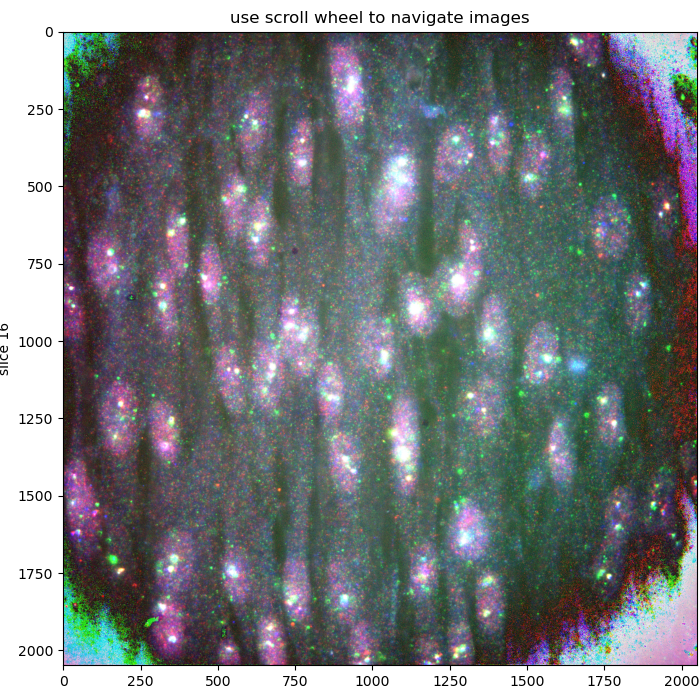

In [32]:
fig, ax = plt.subplots(ncols = 1, nrows = 1,figsize=(7,7)) 
tracker = imdis.singleImageScroller(ax, overlayList)
fig.canvas.mpl_connect('scroll_event', tracker.onscroll)

fig.tight_layout(pad=0,w_pad=0,h_pad=0)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_07_{expDate}.png')

Ok, The three colors have pretty much a very high overlap. That is expected. Let's remember the info in ColorUsage.csv:

In [33]:
colorUsageDF.head()

,Hyb,750,647,561,488,405
0,H0R0,NaN,NaN,NaN,beads,DAPI
1,H1R1,u369,u370,u368,beads,NaN
2,H2R2,u372,u373,u371,beads,NaN
3,H3R3,u376,u374,u375,beads,NaN
4,H4R4,u379,u377,u378,beads,NaN


For example in H1R1, 3 Channels are adjacent positions in the genome, however, it seems that all hybs have 3 adjacent positions. Then, I would expect them to seem overlapped when overlaid as above. The position is expected to not be exactly the same, but without 3D fitting, it is not possible to notice the difference.

Ok, Now I will get the fitting functions necesary for fittin. I cloned Pu's repository:

    git clone https://github.com/zhengpuas47/ImageAnalysis3.git
    
I also need to add the following packages:

    pip install pyFFTW
    pip install biopython
    pip install psutil
   
I also had to comment these lines in library_tools

    sys.path.append(os.getcwd())
    from seqint import seq2Int,seq2Int_rc
    
and add (when necessary)

    #python functions to convert seq->number
    def seq2Int(seq):
        dic_conv = {'C':1,'c':1,'G':2,'g':2,'T':3,'t':3}
        digits = np.array([dic_conv.get(let,0) for let in seq],dtype='uint64')
        word = len(seq)
        base = 4**(np.arange(word,dtype='uint64')[::-1])
        return np.sum(base*digits)
    def seq2Int_rc(seq):
        dic_conv = {'G':1,'g':1,'C':2,'c':2,'A':3,'a':3}
        digits = np.array([dic_conv.get(let,0) for let in seq],dtype='uint64')
        word = len(seq)
        base = 4**(np.arange(word,dtype='uint64')[::-1])
        return np.sum(base*digits)

    
  

In [34]:
sys.path.insert(0,'C:/Software/')

import ImageAnalysis3 as ia
from ImageAnalysis3 import get_img_info, visual_tools, corrections, classes, alignment_tools, spot_tools
print(os.getpid())

71972


I will try to get a single channel image as input to the function

In [35]:
fov = 0
remoteFolder = 'w:/20190627_IMR90_CTP05_DNA/'
folderName = 'H1R1'
fileName = f'Conv_zscan_{fov:02.0f}.dax'
filePath = f'{remoteFolder}{folderName}/{fileName}'
imageStack = dr.DaxReader(filePath)

<IPython.core.display.Javascript object>


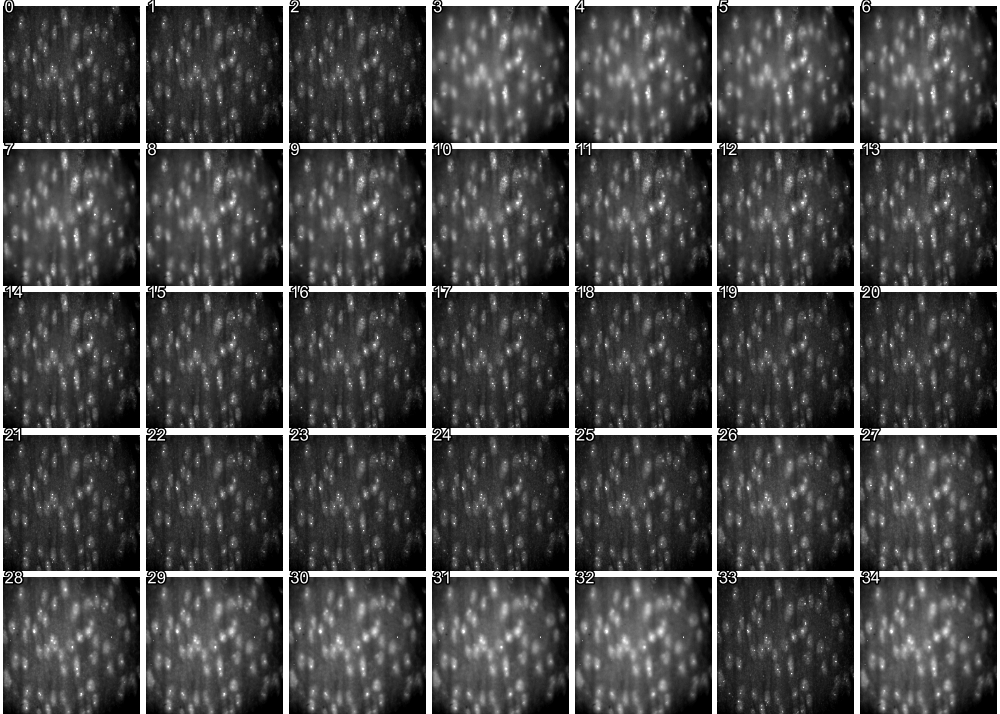

<IPython.core.display.Javascript object>


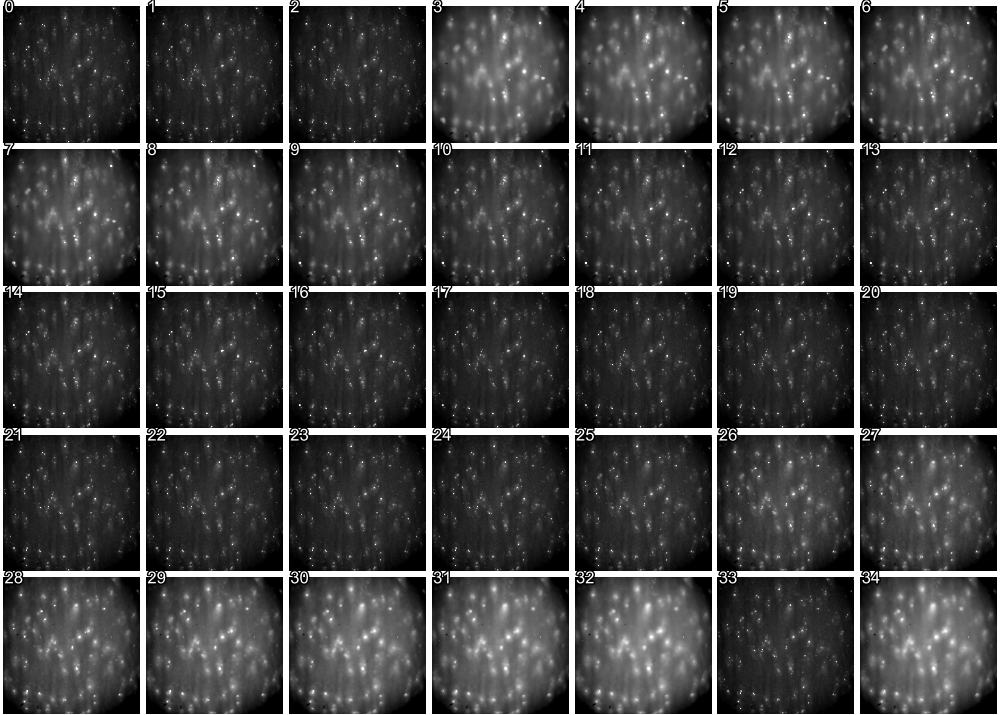

<IPython.core.display.Javascript object>


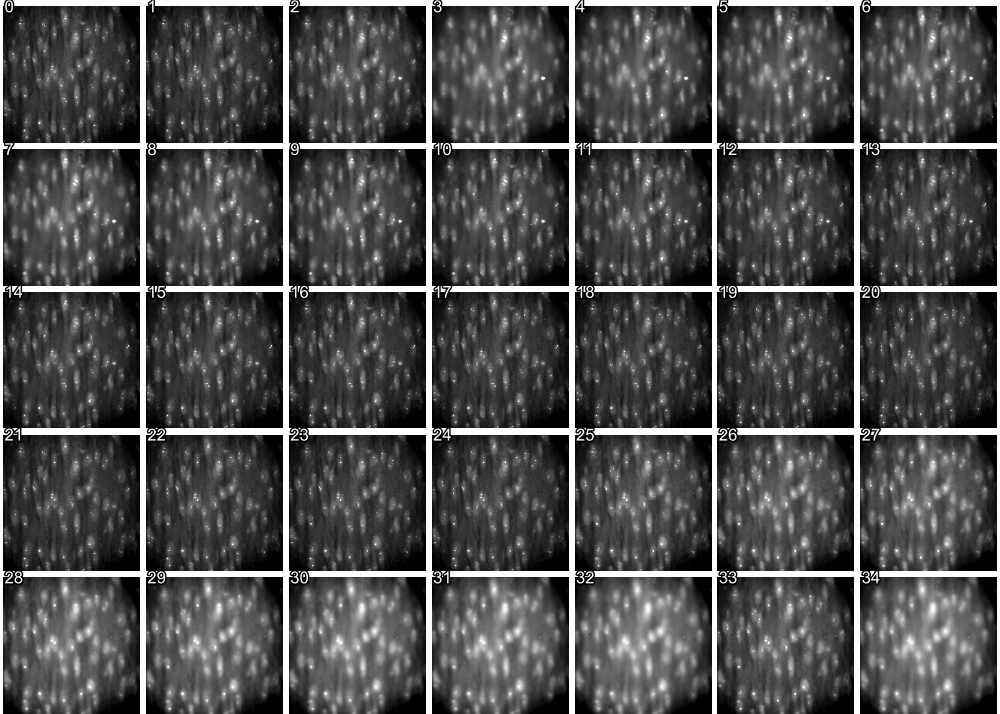

<IPython.core.display.Javascript object>


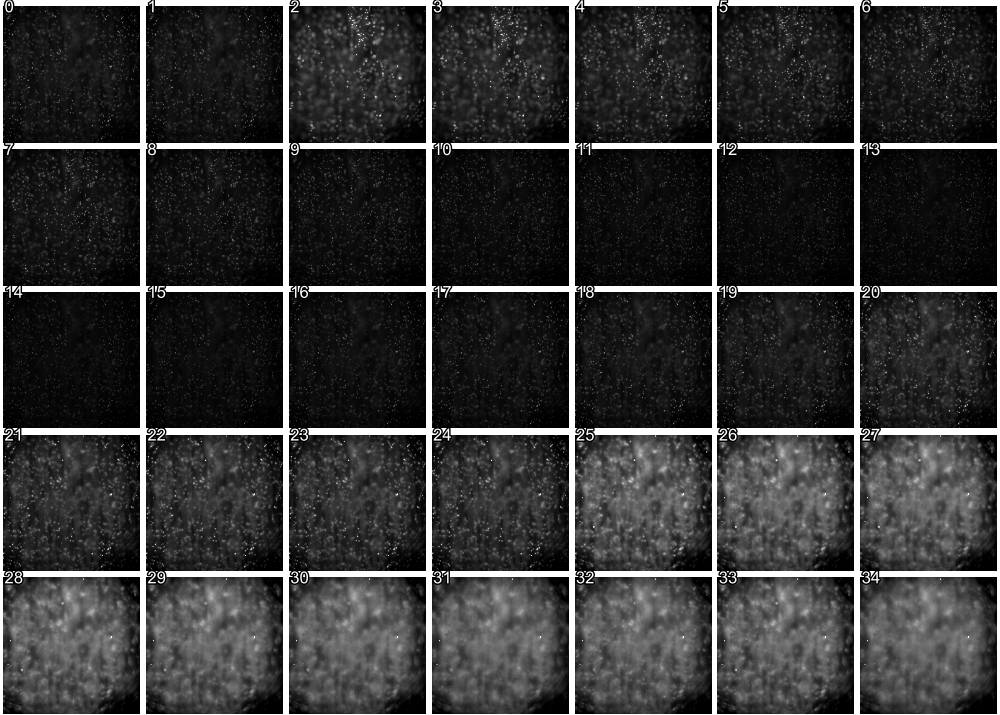

In [36]:
for j in range(4):

    ncols = 7
    nrows = 5
    xfigsize = 10
    yfigsize = xfigsize*(nrows/ncols)
    fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(xfigsize,yfigsize), sharex=True, sharey=True)

    ax = np.ravel(ax)

    frame_num = list(range(0,140,4))
    for i in range(len(frame_num)):
        I = imageStack.loadAFrame(frame_num[i]+j)
        
        vmin, vmax = imdis.getImageValueRange(I,5,99.9)

        ax[i].imshow(I, cmap='gray', vmin=vmin, vmax=vmax, )
        ax[i].axis('off')
        txt = ax[i].text(20,20,f'{i}',va='center',ha='left',c='w',fontsize=12)
        txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k')])

    fig.tight_layout(pad=0,w_pad=0,h_pad=0)  # otherwise the right y-label is slightly clipped
    # plt.show()
    # fig.savefig(f'j{expName}_02_{expDate}.png')

In [37]:
fov = 0
remoteFolder = 'w:/20190627_IMR90_CTP05_DNA/'
folderName = 'H1R1'
fileName = f'Conv_zscan_{fov:02.0f}.dax'
filePath = f'{remoteFolder}{folderName}/{fileName}'
imReader = dr.DaxReader(filePath)
selectedFrames = list(range(12,132,4))
I = np.zeros((len(selectedFrames),2048,2048))
                    
# get all images
for frame in range(len(selectedFrames)):
    I[frame,:,:] = imReader.loadAFrame(selectedFrames[frame])

In [38]:
seeds = ia.spot_tools.fitting.get_seeds(I,verbose=True)

-- start seeding image, th=150.00->150.00, found 2665 seeds in 40.58s


In [39]:
seeds

array([[  14.,  402., 1316.],
       [  20.,  798.,  460.],
       [   8., 1298., 1070.],
       ...,
       [  12., 1239.,  876.],
       [  19., 1525.,  110.],
       [  17.,  991., 1056.]])

In [40]:
spots = ia.spot_tools.fitting.fit_fov_image(I,1)

-- start fitting spots in channel:1, 414 seeded, 

C:/Software\ImageAnalysis3\External\Fitting_v4.py:199: RuntimeWarning: overflow encountered in exp
  return 2./(1+np.exp(t_))-1.


414 fitted in 49.340s.


In [41]:
spots

array([[ 1.1561763e+04,  1.4132785e+01,  4.0217752e+02, ...,
         1.5969147e-01, -1.0000000e+00,  3.7112668e+02],
       [ 9.2366992e+03,  1.9297159e+01,  7.9770538e+02, ...,
         4.6783444e-02, -4.2805318e-02,  3.5609573e+02],
       [ 8.6500117e+03,  7.9808660e+00,  1.2978657e+03, ...,
         1.0884567e-01,  5.9869367e-01,  2.5370282e+02],
       ...,
       [ 4.1697610e+02,  1.9289499e+01,  8.6662054e+02, ...,
        -1.6132766e-01,  3.2585438e-02,  4.2893101e+01],
       [ 4.4308603e+02,  4.7796812e+00,  4.2714026e+02, ...,
        -7.7891080e-03, -6.8517245e-02,  4.0499329e+01],
       [ 3.7449066e+02,  1.1939220e+01,  3.3340915e+02, ...,
         2.0746861e-02,  5.4538125e-01,  3.5754848e+01]], dtype=float32)

In [42]:
spots.shape

(414, 11)

In [43]:
spots[0,:]

array([ 1.1561763e+04,  1.4132785e+01,  4.0217752e+02,  1.3156615e+03,
        1.2513971e+03,  1.5869602e+00,  1.4543471e+00,  1.6375923e+00,
        1.5969147e-01, -1.0000000e+00,  3.7112668e+02], dtype=float32)

Ok, great the new modification from Pu solved issues. The fitting seems to work well, Below is an exerpt from the code with the explanation on the fit:
    
    """
        Given a set of seeds <centers> in a 3d image <im> iteratively 3d gaussian fit around the seeds (in order of brightness) 
        and subtract the gaussian signal.
        Retruns a numpy array of size Nx(height, x, y, z, width_x, width_y,width_z,background) where N~len(centers). Bad fits are disregarded.
        Warning: Generally a bit slow. In practice, the faster version fast_local_fit is used.
    """
    
I should expect 8 columns, but got 11. What is the difference? 
 
I asked Pu about it, he says that the first 8 columns are :

    hf = height
    xc = x
    yc = y
    zc = z
    bkf = background
    w1f = width_x
    w2f = width_y
    w3f = width_z
    
Actually, later I found other comments in the fit function:

    """
    This implements the Levenberg-Marquardt algorithm for 3D gaussian fitting.
    Stores the results in [height,x,y,z,background,width_1,width_2,width_3,sin_theta,sin_phi,error] = self.p
    """

In [44]:
outputFolder = 'g:/analysis/CNVs/CNV002_spots/'
colorUsageDF = pd.read_csv(f'{remoteFolder}Analysis/Color_Usage.csv')

for hyb_num in range(colorUsageDF.shape[0]):
    
    folderName = colorUsageDF.iloc[hyb_num,0]
    print(f'\n\nAnalyzing files in {folderName}.')
    
    # Only analyze rounds with 750, 650 and 560 channels
    if not any(colorUsageDF.iloc[hyb_num,1:4].isna()):
        
        # Get file names
        fileNames = sorted([x for x in os.listdir(f'{remoteFolder}{folderName}')  if '.dax' in x])
        
        # for each file
        for file_num in range(len(fileNames)):
            
            # read the image file
            imReader = dr.DaxReader(f'{remoteFolder}{folderName}/{fileNames[file_num]}')
                                     
            # for each channel
            for channel_num in range(3):
                outputFile = f'{outputFolder}{folderName}_{fileNames[file_num].replace(".dax","")}_{channel_num}.npy'
                
                # only run the analysis if file doest not exist already
                if not os.path.exists(outputFile):
                    start = [12,13,10] 
                    stop = [132, 133, 130]
                    selectedFrames = list(range(start[channel_num],stop[channel_num],4))
                    I = np.zeros((len(selectedFrames),2048,2048))
                    
                    # get all images
                    for frame in range(len(selectedFrames)):
                        I[frame,:,:] = imReader.loadAFrame(selectedFrames[frame])
                   
                    # try running the code
                    try:
                        spots = ia.spot_tools.fitting.fit_fov_image(I,channel_num, max_num_seeds=1000)
                        np.save(outputFile, spots)  
                        print(f'{outputFile} created.')
                    except:
                        print(f'{outputFile} was not created, Skipping.')
                else:
                    print(f'{outputFile} already exists. Skipping.')



Analyzing files in H0R0.


Analyzing files in H1R1.
-- start fitting spots in channel:0, g:/analysis/CNVs/CNV002_spots/H1R1_Conv_zscan_00_0.npy was not created, Skipping.
-- start fitting spots in channel:1, g:/analysis/CNVs/CNV002_spots/H1R1_Conv_zscan_00_1.npy was not created, Skipping.
-- start fitting spots in channel:2, g:/analysis/CNVs/CNV002_spots/H1R1_Conv_zscan_00_2.npy was not created, Skipping.


KeyboardInterrupt: 

Ok, let's see the data we have until now. 

In [45]:
# read all the files in the folder
outputFolder = 'g:/analysis/CNVs/CNV002/spots/'
fileList = os.listdir(f'{outputFolder}')
availableFolders = list(np.unique([x.split('_')[0] for x in fileList]))

# get all the existent values
for folder_num in range(len(availableFolders)):
    spotList = [[],[],[]]
    subList = [x for x in fileList if availableFolders[folder_num] in x]
    for file_num in range(len(subList)): 
        spots = np.load(f'{outputFolder}{subList[file_num]}')
        
        # calculate volume
        volume = ((math.pi)**(3/2))*spots[:,0]*np.sqrt(spots[:,5]*spots[:,6]*spots[:,7])
        volume = np.reshape(volume,(spots.shape[0],1))
        spots = np.concatenate((spots,volume), axis=1)
        
        # keep only rows with finite values
#         spots = spots[~np.isfinite(spots).any(axis=1)]
                               
        # get chaqnnel information 
        channel = int(re.split(r'[_.]',subList[file_num])[4])
        
        # add channel to spotList
        spotList[channel].append(spots)
        
# create combined spotlist
combinedSpotList = [[],[],[]]
for channel in range(3):
    combinedSpotList[channel] = np.concatenate(spotList[channel])

<IPython.core.display.Javascript object>


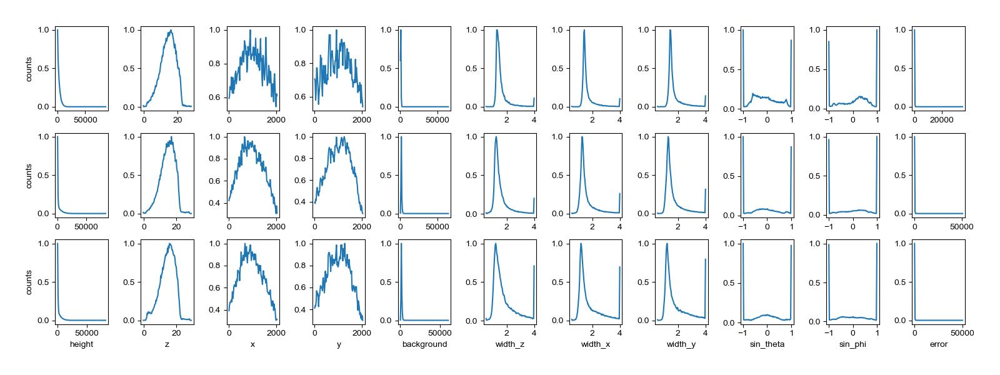

In [46]:
fig,ax = plt.subplots(nrows=3,ncols=11,figsize=(16,6))

xlabels = ['height','z','x','y','background','width_z','width_x','width_y','sin_theta','sin_phi','error']
for i in range(3):
    for j in range(11):
        hist, bin_edges = np.histogram(combinedSpotList[i][:,j], bins=100)
        bin_centers = bin_edges[0:-1] + (bin_edges[1] - bin_edges[0])/2   
        ax[i,j].plot(bin_centers,hist/max(hist))
        if j == 0:
            ax[i,j].set_ylabel('counts')
        if i == 2:
            ax[i,j].set_xlabel(xlabels[j])
        
fig.tight_layout(pad=3,w_pad=1,h_pad=1)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_08_{expDate}.png')

<IPython.core.display.Javascript object>


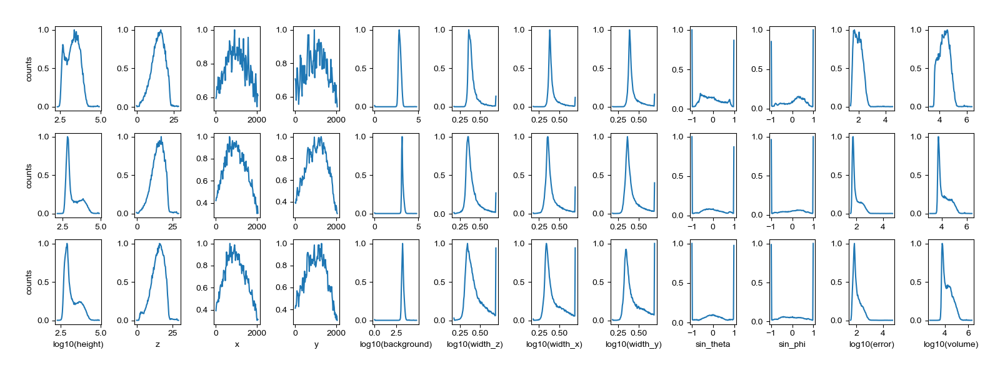

In [47]:
fig,ax = plt.subplots(nrows=3,ncols=12,figsize=(16,6))

xlabels = ['height','z','x','y','background','width_z','width_x','width_y','sin_theta','sin_phi','error','volume']
for i in range(3):
    for j in range(12):
        val = combinedSpotList[i][:,j]
                    
        if (j>=1 and j<=3) or (j>=8 and j<=9):
            xlabel = xlabels[j]
        else:
            val = np.log10(val+1)
            xlabel = f'log10({xlabels[j]})'
            
        hist, bin_edges = np.histogram(val, bins=100)
        bin_centers = bin_edges[0:-1] + (bin_edges[1] - bin_edges[0])/2   
        ax[i,j].plot(bin_centers,hist/max(hist))
            
        if j == 0:
            ax[i,j].set_ylabel('counts')
        if i == 2:
            ax[i,j].set_xlabel(xlabel)

fig.tight_layout(pad=3,w_pad=1,h_pad=1)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_09_{expDate}.png')

<IPython.core.display.Javascript object>


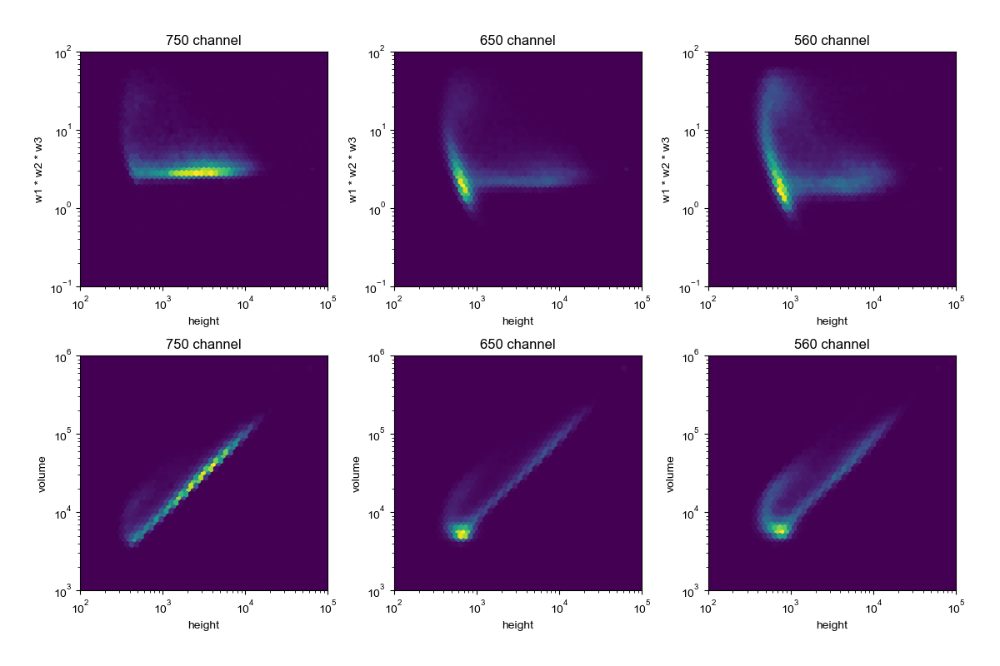

In [48]:
fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(12,8))

title = [750,650,560]

for i in range(3):
    height = combinedSpotList[i][:,0]
    volume = combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7]
    ax[0,i].hexbin(height,volume,gridsize=50,xscale='log',yscale='log',extent=(2,5,-1,2))
    ax[0,i].set_xlabel('height')
    ax[0,i].set_ylabel('w1 * w2 * w3')
    ax[0,i].set_title(f'{title[i]} channel')
    ax[0,i].axis([1e2,1e5,1e-1,1e2])
    
for i in range(3):
    height = combinedSpotList[i][:,0]
    volume = (math.pi**(3/2))*combinedSpotList[i][:,0]*np.sqrt(combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7])
    ax[1,i].hexbin(height,volume,gridsize=50,xscale='log',yscale='log',extent=(2,5,3,6))
    ax[1,i].set_xlabel('height')
    ax[1,i].set_ylabel('volume')
    ax[1,i].set_title(f'{title[i]} channel')
    ax[1,i].axis([1e2,1e5,1e3,1e6])

fig.tight_layout(pad=3,w_pad=1,h_pad=1)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_10_{expDate}.png')

<IPython.core.display.Javascript object>


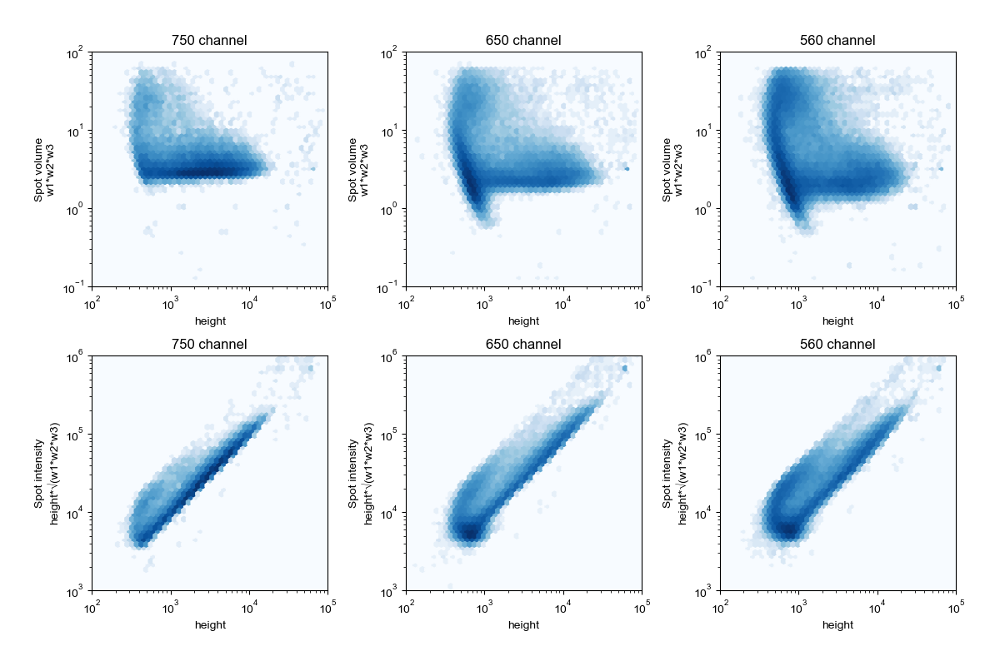

In [49]:
fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(12,8))

title = [750,650,560]

for i in range(3):
    height = combinedSpotList[i][:,0]
    volume = combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7]
    ax[0,i].hexbin(height,volume,gridsize=50,xscale='log',yscale='log',extent=(2,5,-1,2),cmap=plt.cm.Blues,bins='log')
    ax[0,i].set_xlabel('height')
    ax[0,i].set_ylabel('Spot volume\nw1*w2*w3')
    ax[0,i].set_title(f'{title[i]} channel')
    ax[0,i].axis([1e2,1e5,1e-1,1e2])
    
for i in range(3):
    height = combinedSpotList[i][:,0]
    volume = (math.pi**(3/2))*combinedSpotList[i][:,0]*np.sqrt(combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7])
    ax[1,i].hexbin(height,volume,gridsize=50,xscale='log',yscale='log',extent=(2,5,3,6),cmap=plt.cm.Blues,bins='log')
    ax[1,i].set_xlabel('height')
    ax[1,i].set_ylabel('Spot intensity\nheight*\u221A(w1*w2*w3)')
    ax[1,i].set_title(f'{title[i]} channel')
    ax[1,i].axis([1e2,1e5,1e3,1e6])

fig.tight_layout(pad=3,w_pad=1,h_pad=1)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_10_{expDate}_2.png')

<IPython.core.display.Javascript object>


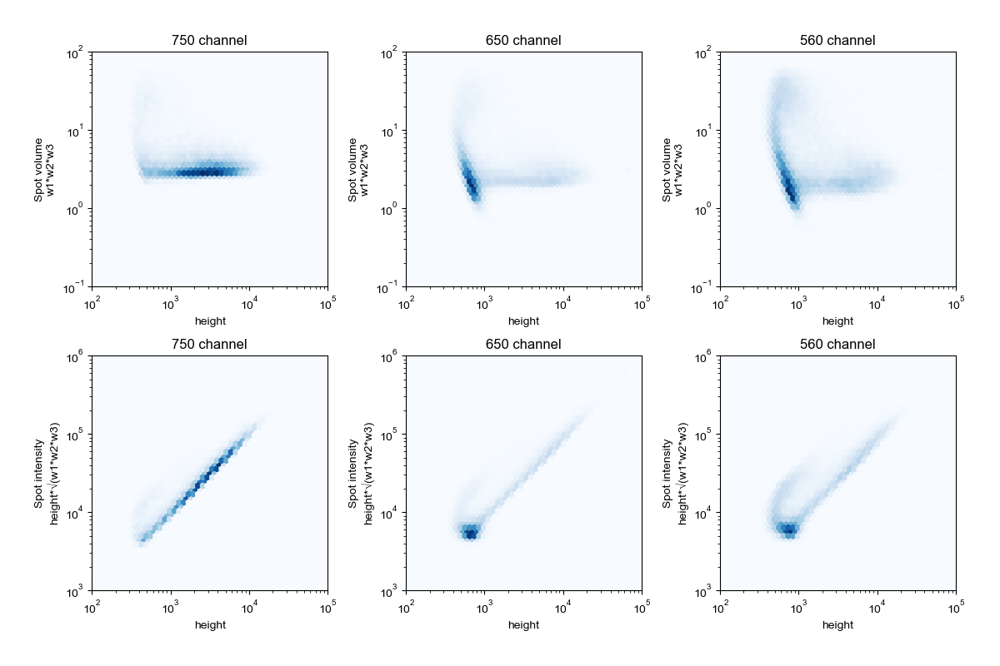

In [50]:
fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(12,8))

title = [750,650,560]

for i in range(3):
    height = combinedSpotList[i][:,0]
    volume = combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7]
    ax[0,i].hexbin(height,volume,gridsize=50,xscale='log',yscale='log',extent=(2,5,-1,2),cmap=plt.cm.Blues)
    ax[0,i].set_xlabel('height')
    ax[0,i].set_ylabel('Spot volume\nw1*w2*w3')
    ax[0,i].set_title(f'{title[i]} channel')
    ax[0,i].axis([1e2,1e5,1e-1,1e2])
    
for i in range(3):
    height = combinedSpotList[i][:,0]
    volume = (math.pi**(3/2))*combinedSpotList[i][:,0]*np.sqrt(combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7])
    ax[1,i].hexbin(height,volume,gridsize=50,xscale='log',yscale='log',extent=(2,5,3,6),cmap=plt.cm.Blues)
    ax[1,i].set_xlabel('height')
    ax[1,i].set_ylabel('Spot intensity\nheight*\u221A(w1*w2*w3)')
    ax[1,i].set_title(f'{title[i]} channel')
    ax[1,i].axis([1e2,1e5,1e3,1e6])

fig.tight_layout(pad=3,w_pad=1,h_pad=1)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_10_{expDate}_3.png')

The intensity difference between spots is due to the background. From the images, I t can be seen that 750 has lower background. 

<IPython.core.display.Javascript object>


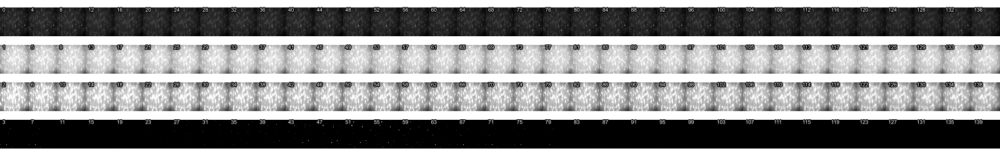

In [51]:
fov = 0
folderName = 'H1R1'
fileName = f'Conv_zscan_{fov:02.0f}.dax'
filePath = f'{remoteFolder}{folderName}/{fileName}'
imageStack = dr.DaxReader(filePath)

ncols=35
nrows= 4

fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(16,2.5), sharex=True, sharey=True)
for row in range(nrows):
    for col in range(ncols):
        frame = col*nrows + row
        
        if frame < 140:
            im = Image.fromarray(imageStack.loadAFrame(frame))
            im = im.resize((64,64),resample=0)
            ax[row,col].imshow(im, vmin=300, vmax=1500, cmap='gray')
            ax[row,col].axis('off')
            txt = ax[row,col].text(5,5,f'{frame}',va='center',ha='left',c='w',fontsize=6)
            txt.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='k')])
    
fig.tight_layout(pad=0,w_pad=0,h_pad=0)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_11_{expDate}.png')

However, the difference between non-real and real spots is still not that great. To help automatic separation of spots, I think it will be better to use evenn more regions.

now let's see the correlation between the spot int or height and the error.

<IPython.core.display.Javascript object>


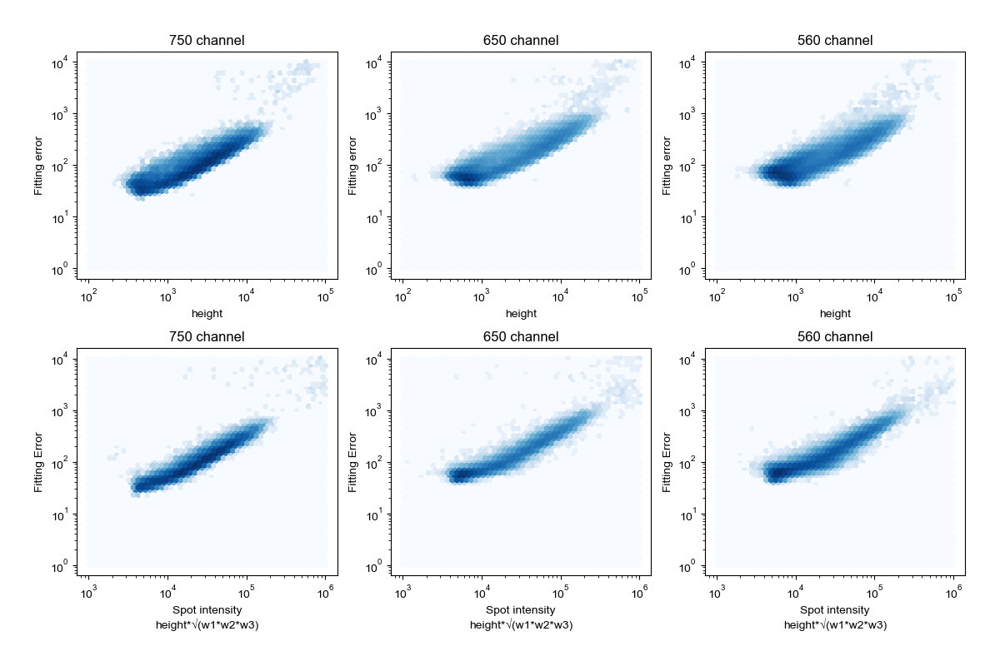

In [52]:
fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(12,8))

title = [750,650,560]

for i in range(3):
    height = combinedSpotList[i][:,0]
    error  = combinedSpotList[i][:,10]
    ax[0,i].hexbin(height,error,gridsize=50,xscale='log',yscale='log',extent=(2,5,0,4),cmap=plt.cm.Blues,bins='log')
    ax[0,i].set_xlabel('height')
    ax[0,i].set_ylabel('Fitting error')
    ax[0,i].set_title(f'{title[i]} channel')
#     ax[0,i].axis([1e2,1e5,1e-1,1e2])
    
for i in range(3):
    
    volume = (math.pi**(3/2))*combinedSpotList[i][:,0]*np.sqrt(combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7])
    error  = combinedSpotList[i][:,10]
    ax[1,i].hexbin(volume,error,gridsize=50,xscale='log',yscale='log',extent=(3,6,0,4),cmap=plt.cm.Blues,bins='log')
    ax[1,i].set_xlabel('Spot intensity\nheight*\u221A(w1*w2*w3)')
    ax[1,i].set_ylabel('Fitting Error')
    ax[1,i].set_title(f'{title[i]} channel')
#     ax[1,i].axis([1e2,1e5,1e3,1e6])

fig.tight_layout(pad=3,w_pad=1,h_pad=1)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_12_{expDate}_0.png')

<IPython.core.display.Javascript object>


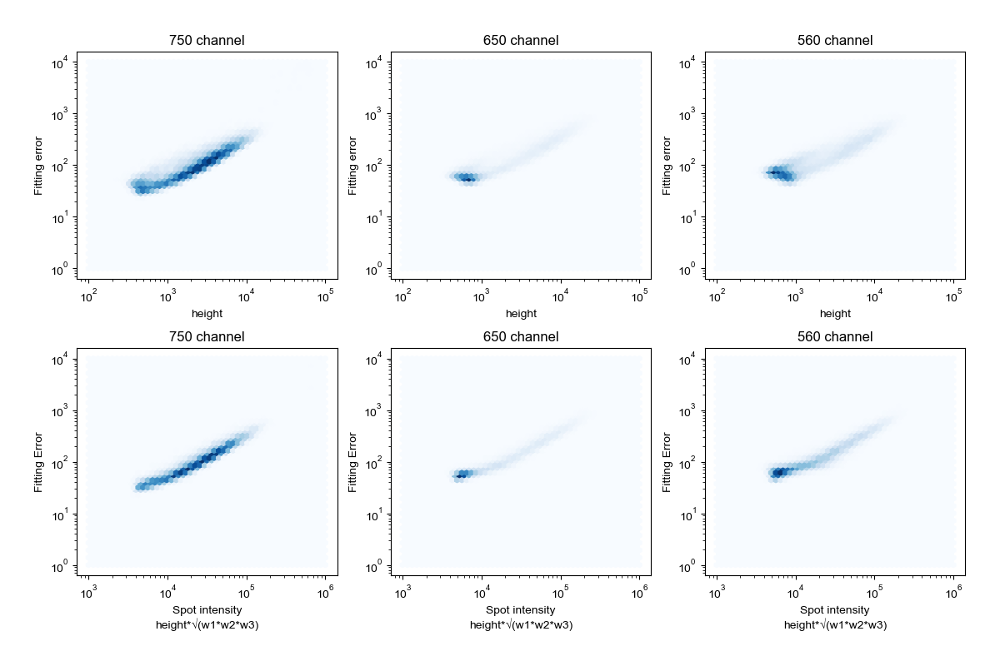

In [53]:
fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(12,8))

title = [750,650,560]

for i in range(3):
    height = combinedSpotList[i][:,0]
    error  = combinedSpotList[i][:,10]
    ax[0,i].hexbin(height,error,gridsize=50,xscale='log',yscale='log',extent=(2,5,0,4),cmap=plt.cm.Blues)
    ax[0,i].set_xlabel('height')
    ax[0,i].set_ylabel('Fitting error')
    ax[0,i].set_title(f'{title[i]} channel')
#     ax[0,i].axis([1e2,1e5,1e-1,1e2])
    
for i in range(3):
    
    volume = (math.pi**(3/2))*combinedSpotList[i][:,0]*np.sqrt(combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7])
    error  = combinedSpotList[i][:,10]
    ax[1,i].hexbin(volume,error,gridsize=50,xscale='log',yscale='log',extent=(3,6,0,4),cmap=plt.cm.Blues)
    ax[1,i].set_xlabel('Spot intensity\nheight*\u221A(w1*w2*w3)')
    ax[1,i].set_ylabel('Fitting Error')
    ax[1,i].set_title(f'{title[i]} channel')
#     ax[1,i].axis([1e2,1e5,1e3,1e6])

fig.tight_layout(pad=3,w_pad=1,h_pad=1)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_12_{expDate}_1.png')

so here the error maqy be larger because this is the total deviation fromthe fit, so the larger the spot, the larger the error. Maybe I can normalize the error by the volume, that may give an idea of the intrinsic level of error. 

<IPython.core.display.Javascript object>


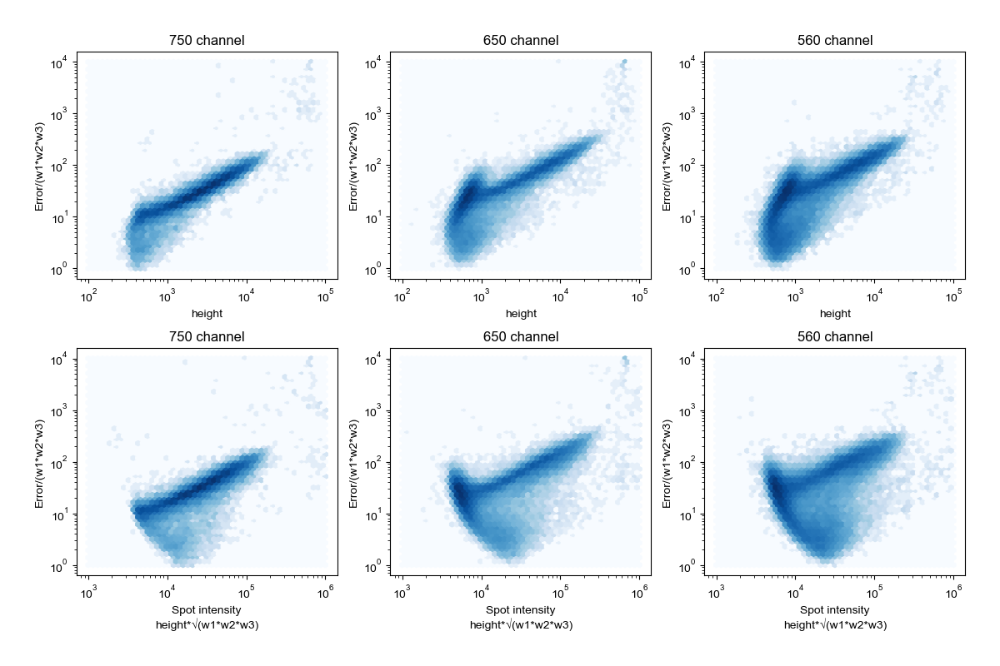

In [54]:
fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(12,8))

title = [750,650,560]

for i in range(3):
    height = combinedSpotList[i][:,0]
    error  = combinedSpotList[i][:,10]/(combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7])
    ax[0,i].hexbin(height,error,gridsize=50,xscale='log',yscale='log',extent=(2,5,0,4),cmap=plt.cm.Blues,bins='log')
    ax[0,i].set_xlabel('height')
    ax[0,i].set_ylabel('Error/(w1*w2*w3)')
    ax[0,i].set_title(f'{title[i]} channel')
#     ax[0,i].axis([1e2,1e5,1e-1,1e2])
    
for i in range(3):
    
    volume = (math.pi**(3/2))*combinedSpotList[i][:,0]*np.sqrt(combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7])
    error  = combinedSpotList[i][:,10]/(combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7])
    ax[1,i].hexbin(volume,error,gridsize=50,xscale='log',yscale='log',extent=(3,6,0,4),cmap=plt.cm.Blues,bins='log')
    ax[1,i].set_xlabel('Spot intensity\nheight*\u221A(w1*w2*w3)')
    ax[1,i].set_ylabel('Error/(w1*w2*w3)')
    ax[1,i].set_title(f'{title[i]} channel')
#     ax[1,i].axis([1e2,1e5,1e3,1e6])

fig.tight_layout(pad=3,w_pad=1,h_pad=1)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_13_{expDate}_0.png')

<IPython.core.display.Javascript object>


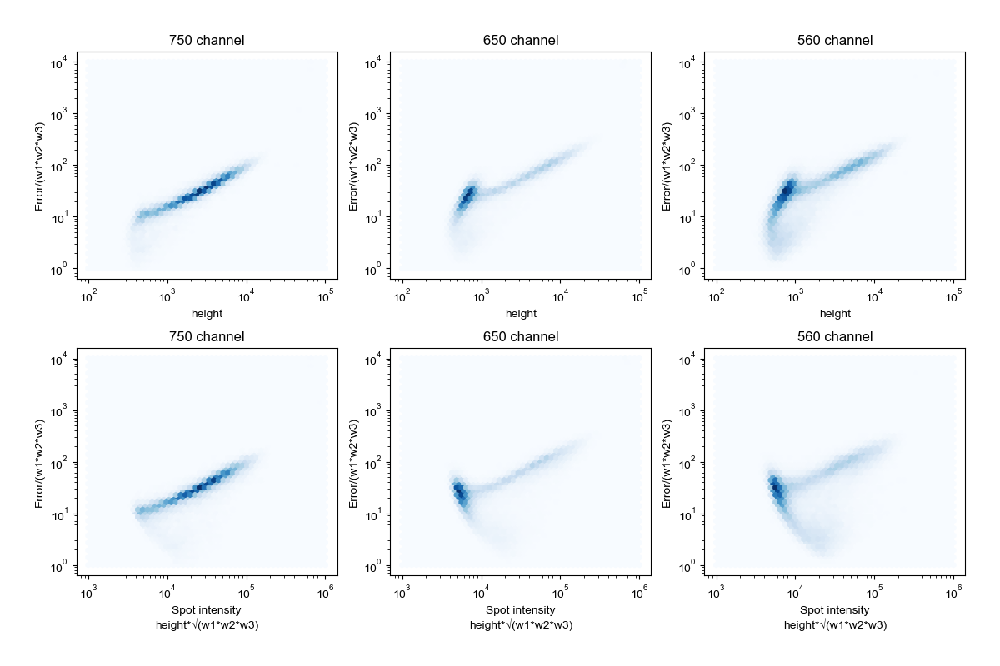

In [55]:
fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(12,8))

title = [750,650,560]

for i in range(3):
    height = combinedSpotList[i][:,0]
    error  = combinedSpotList[i][:,10]/(combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7])
    ax[0,i].hexbin(height,error,gridsize=50,xscale='log',yscale='log',extent=(2,5,0,4),cmap=plt.cm.Blues)
    ax[0,i].set_xlabel('height')
    ax[0,i].set_ylabel('Error/(w1*w2*w3)')
    ax[0,i].set_title(f'{title[i]} channel')
#     ax[0,i].axis([1e2,1e5,1e-1,1e2])
    
for i in range(3):
    
    volume = (math.pi**(3/2))*combinedSpotList[i][:,0]*np.sqrt(combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7])
    error  = combinedSpotList[i][:,10]/(combinedSpotList[i][:,5]*combinedSpotList[i][:,6]*combinedSpotList[i][:,7])
    ax[1,i].hexbin(volume,error,gridsize=50,xscale='log',yscale='log',extent=(3,6,0,4),cmap=plt.cm.Blues)
    ax[1,i].set_xlabel('Spot intensity\nheight*\u221A(w1*w2*w3)')
    ax[1,i].set_ylabel('Error/(w1*w2*w3)')
    ax[1,i].set_title(f'{title[i]} channel')
#     ax[1,i].axis([1e2,1e5,1e3,1e6])

fig.tight_layout(pad=3,w_pad=1,h_pad=1)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_13_{expDate}_1.png')

Ok, now let's take a look at the segmentations created by Pu. 

# Look at Pu's segmentation masks, compare with cellpose. 

In [56]:
# load the image
fov = 0
folderName = 'H0R0'
fileName = f'Conv_zscan_{fov:02.0f}.dax'
filePath = f'{remoteFolder}{folderName}/{fileName}'
imageStack = dr.DaxReader(filePath)

In [57]:
# load the segmentation mask
fov = 0
segmentationFolder = f'{remoteFolder}Analysis/segmentation/'
segFileName = f'Conv_zscan_{fov:02.0f}_segmentation.npy'
segFilePath = f'{segmentationFolder}/{segFileName}'
segMask = np.load(segFilePath)

In [58]:
segMask.shape

(2048, 2048)

Ok, they use a single mask.  

In [59]:
I = imageStack.loadAFrame(139)
channels = [0,0]
model_cyto = models.Cellpose(gpu=False, model_type='cyto')
masks_cyto, flows_cyto, styles_cyto, diams_cyto = model_cyto.eval(I, channels=channels,diameter=80)

>>>> using CPU
Running test snippet to check if MKL-DNN working
see https://pytorch.org/docs/stable/backends.html?highlight=mkl
** MKL version working - CPU version is sped up. **
processing 1 image(s)
time spent: running network 27.18s; flow+mask computation 4.23
estimated masks for 1 image(s) in 31.58 sec
>>>> TOTAL TIME 31.58 sec


In [60]:
cellposeOutline = imdis.getMaskBoundaries(masks_cyto)
cellposeOutline = morphology.dilation(cellposeOutline,morphology.selem.disk(1))

In [61]:
previousOutline = imdis.getMaskBoundaries(segMask)
previousOutline = morphology.dilation(previousOutline,morphology.selem.disk(1))

In [62]:
imageChannels = np.stack([I, cellposeOutline.astype(int), previousOutline.astype(int)])
channelColors = np.array([[1, 1, 1], [1, 0, 0],[0, 1, 0]])
overlay = imdis.getImageMaskOverlay(imageChannels, channelColors,['image','mask', 'mask'],5,99)

<IPython.core.display.Javascript object>


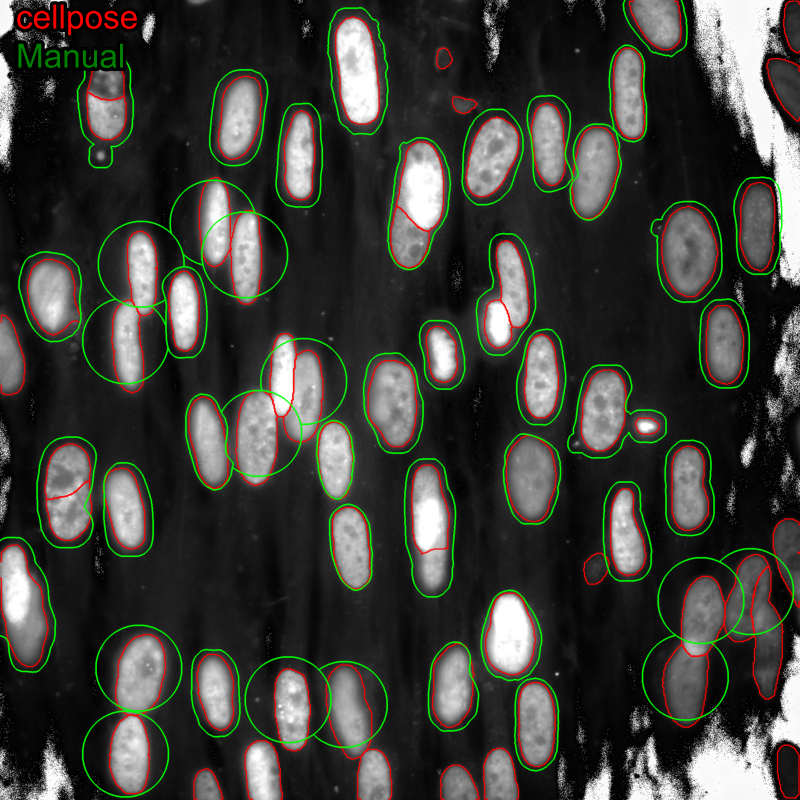

In [63]:
fig,ax = plt.subplots(nrows=1,ncols=1,figsize=(8,8),sharex=True,sharey=True)
ax.imshow(overlay)
ax.axis('off')

txt = ax.text(40,50,'cellpose',va='center',ha='left',c='r',fontsize=24)
txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])

txt = ax.text(40,150,'Manual',va='center',ha='left',c='g',fontsize=24)
txt.set_path_effects([PathEffects.withStroke(linewidth=5, foreground='k')])

fig.tight_layout(pad=0,w_pad=0,h_pad=0)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_12_{expDate}.png')

Ok, the existing cell masks are not very good. I will run cellpose in one of the middle images for each image.

# Run cellpose for all images. 

In [64]:
folderName = 'H0R0'
outputFolder = 'g:/analysis/CNVs/CNV002/cellpose/'

fileList = sorted([x for x in os.listdir(f'{remoteFolder}{folderName}/') if 'dax' in x])
for i in range(len(fileList)):
    outputFile = f'{outputFolder}mask_{i:02d}.npy'
    if not os.path.isfile(outputFile):
        imageStack = dr.DaxReader( f'{remoteFolder}{folderName}/{fileList[i]}' )
        I = imageStack.loadAFrame(139)

        model_cyto = models.Cellpose(gpu=False, model_type='cyto')
        masks_cyto, flows_cyto, styles_cyto, diams_cyto = model_cyto.eval(I, channels=channels,diameter=80)
    
        np.save(outputFile, masks_cyto)

Now filter each FOV, removing cells touching the FOV border, first let's check how to do it.

<IPython.core.display.Javascript object>


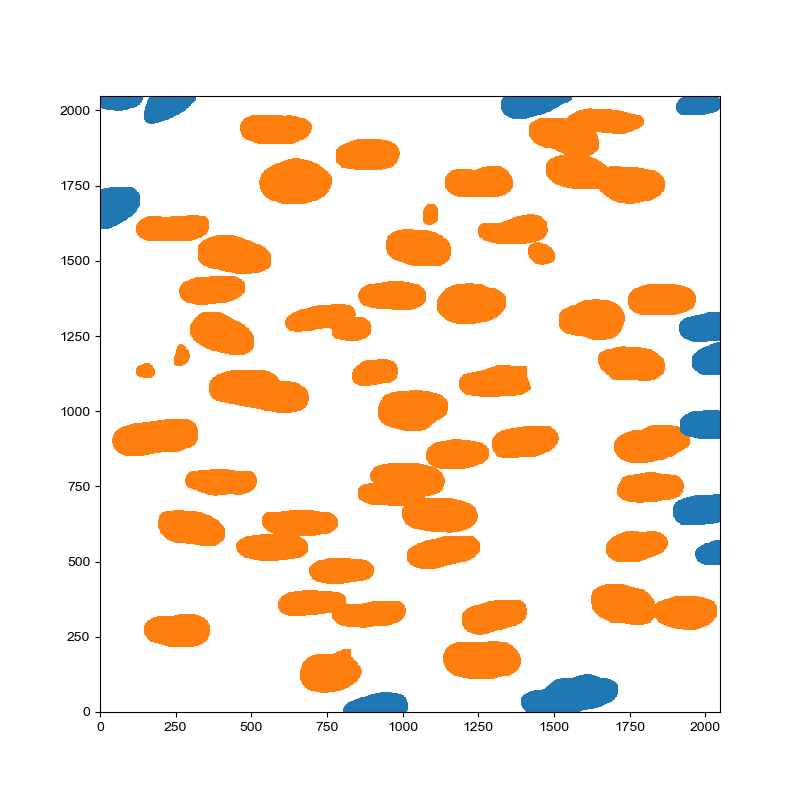

(0.0, 2048.0, 0.0, 2048.0)

In [65]:
fig,ax=plt.subplots(nrows=1,ncols=1,figsize=(8,8))
cell_id = np.unique(masks_cyto)
cell_id = cell_id[1:]
for i in range(cell_id.size):
    x,y = np.where(masks_cyto == cell_id[i])
    if np.any(np.concatenate((x,y)) <10) or np.any(np.concatenate((x,y)) >2038 ):
        ax.scatter(x,y,color='C0',s=1)
    else:
        ax.scatter(x,y,color='C1',s=1)
ax.axis([0,2048,0,2048])

<IPython.core.display.Javascript object>


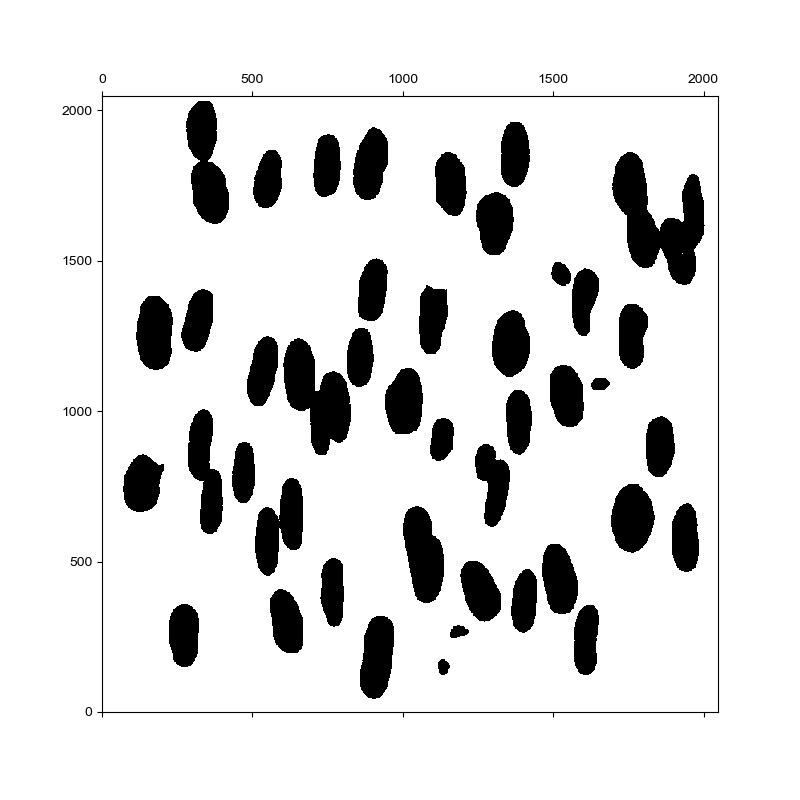

(0.0, 2048.0, 0.0, 2048.0)

In [66]:
fig,ax=plt.subplots(nrows=1,ncols=1,figsize=(8,8))
mask = masks_cyto.copy()
cell_id = np.unique(mask)
cell_id = cell_id[1:]
for i in range(cell_id.size):
    x,y = np.where(masks_cyto == cell_id[i])
    if np.any(np.concatenate((x,y)) <10) or np.any(np.concatenate((x,y)) >2038 ):
        mask[x,y] = 0

ax.spy(mask)
ax.axis([0,2048,0,2048])

let's be sure I can overlay things properly

<IPython.core.display.Javascript object>


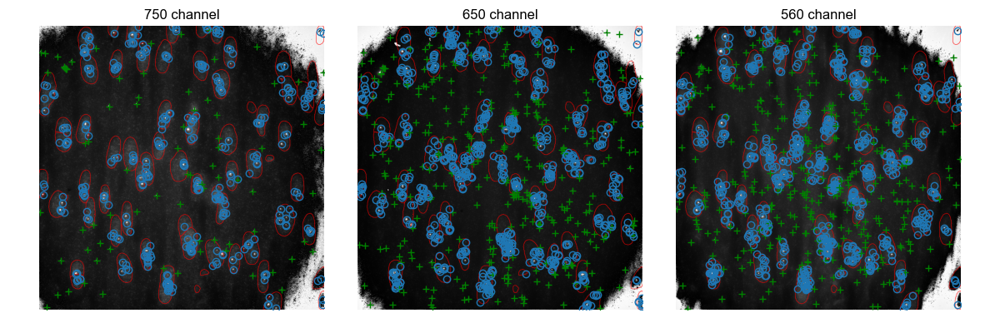

In [170]:
mask = np.load('g:/analysis/CNVs/CNV002/cellpose/mask_00.npy')
imageStack = dr.DaxReader( f'{remoteFolder}H1R1/Conv_zscan_00.dax')
               
fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(12,4),sharex=True,sharey=True)

title = [750,650,560]
start = [12,13,10] 
stop  = [132, 133, 130]
for i in range(3):
    
    frames = list(range(start[i],stop[i],4))
    I = np.zeros((len(frames),2048,2048))
    for j in range(len(frames)):
        I[j,:,:] = imageStack.loadAFrame(frames[j])
     
    # calculate mip
    MIP = I.max(axis=0)
    
    # create MIP/mask overlay
    cellposeOutline = imdis.getMaskBoundaries(mask)
    cellposeOutline = morphology.dilation(cellposeOutline,morphology.selem.disk(1))
    imageChannels = np.stack([MIP, cellposeOutline.astype(int)])
    channelColors = np.array([[1, 1, 1], [1, 0, 0]])
    overlay = imdis.getImageMaskOverlay(imageChannels, channelColors,['image','mask'],5,99.9)
    
    ax[i].imshow(overlay)
    ax[i].axis([0,2048,0,2048])
    ax[i].axis('off')
    ax[i].set_title(f'{title[i]} channel')
    
    # add spots
    spots = np.load(f'g:/analysis/CNVs/CNV002/spots/H1R1_Conv_zscan_00_{i}.npy') 
    for j in range(spots.shape[0]):
        x = spots[j,3]
        y = spots[j,2]
        if np.any(mask[np.floor(y).astype(int):np.ceil(y).astype(int), np.floor(x).astype(int):np.ceil(x).astype(int)]):
            ax[i].plot(x,y,'o',mec='C0',mfc='None')
        else:
            ax[i].plot(x,y,'+',mec='g',mfc='None')
#         ax[i].text(x,y,f'{np.log10(spots[j,0]):.1f}',fontsize=7,color='C2',ha='left')
          
fig.tight_layout(pad=2,w_pad=0.1,h_pad=0.1)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_13_{expDate}.png')

Ok, got it. Now let's allocate spots to cells. 

In [68]:
# read all cellpose masks into an array.
cellposeFolder = 'g:/analysis/CNVs/CNV002/cellpose/'

if os.path.isfile(f'{cellposeFolder}bg_masks.npy'):
    bg_masks = np.load(f'{cellposeFolder}bg_masks.npy')
    cell_masks = np.load(f'{cellposeFolder}cell_masks.npy')
else:

    fileList = sorted([x for x in os.listdir(f'{cellposeFolder}/') if 'npy' in x])

    bg_masks = np.zeros((len(fileList),2048,2048))
    cell_masks = np.zeros((len(fileList),2048,2048))

    for i in range(len(fileList)):
        maskFilePath = f'{cellposeFolder}{fileList[i]}'

        mask = np.load(maskFilePath)
        mask = mask>0
        bgMask = morphology.dilation(mask,morphology.selem.disk(50))
        bgMask = bgMask<1

        cell_masks[i,:,:] = mask.astype(int)
        bg_masks[i,:,:] = bgMask.astype(int)

        print(maskFilePath,end='\r')
        
    np.save(f'{cellposeFolder}bg_masks.npy',bg_masks)
    np.save(f'{cellposeFolder}cell_masks.npy',cell_masks)

<IPython.core.display.Javascript object>


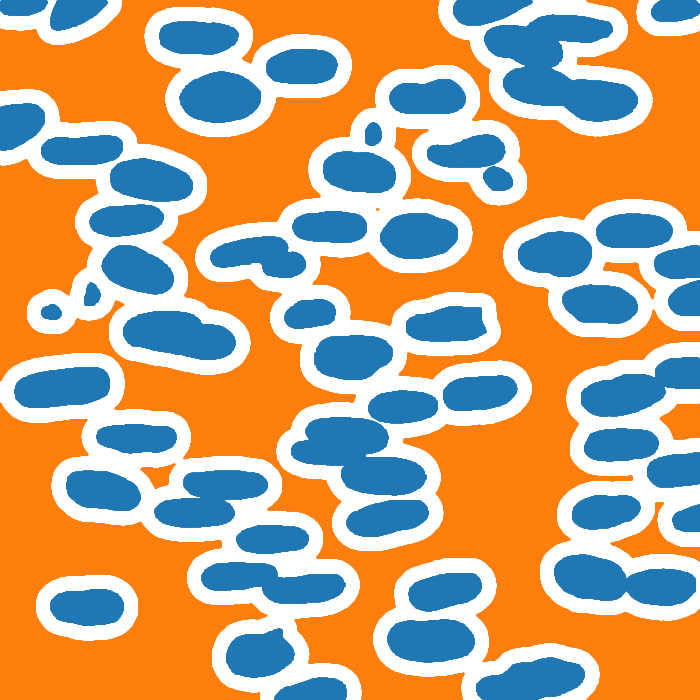

In [69]:
fig,ax=plt.subplots(nrows=1,ncols=1,figsize=(7,7),sharex=True,sharey=True)
x0,y0 = np.where(cell_masks[0,:,:])
x1,y1 = np.where(bg_masks[0,:,:])

ax.plot(x0,y0,'.',ms=1)
ax.plot(x1,y1,'.',ms=1)
ax.axis([0,2048,0,2048])
ax.axis('off')

fig.tight_layout(pad=0,w_pad=0,h_pad=0)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_14_{expDate}.png')

In [71]:
# read all the files in the folder
spotOutputFolder = 'g:/analysis/CNVs/CNV002/spots/'
spotFileList = os.listdir(f'{spotOutputFolder}')
availableFolders = list(np.unique([x.split('_')[0] for x in spotFileList]))

pickleName = 'combined_spot_list.pkl' 
outputFile = f'{spotOutputFolder}{pickleName}'

if Path(outputFile).is_file():
    with open(outputFile,'rb') as f: 
        combinedSpotList = pickle.load(f)
    
else:    
    spotList = [[],[],[]]
    for folder_num in range(28): 

        for fov in range(70):
            mask = cell_masks[fov,:,:].squeeze()
            mask_bg = bg_masks[fov,:,:].squeeze()

            for channel_num  in range(3):
                spots = np.load(f'{spotOutputFolder}H{folder_num+1}R{folder_num+1}_Conv_zscan_{fov:02d}_{channel_num}.npy')
                spot_class = np.zeros((spots.shape[0],1))  
                spot_int = np.zeros((spots.shape[0],1))
                spot_vol = np.zeros((spots.shape[0],1))

                for spot_num in range(spots.shape[0]):
                    x = spots[spot_num,3]
                    y = spots[spot_num,2]
                    spot_int[spot_num] = ((math.pi)**(3/2))*spots[spot_num,0]*np.sqrt(spots[spot_num,5]*spots[spot_num,6]*spots[spot_num,7])
                    spot_vol[spot_num] = spots[spot_num,5]*spots[spot_num,6]*spots[spot_num,7]

                    if np.any(mask[np.floor(y).astype(int):np.ceil(y).astype(int), np.floor(x).astype(int):np.ceil(x).astype(int)]):
                        spot_class[spot_num] = 1
                    if np.any(mask_bg[np.floor(y).astype(int):np.ceil(y).astype(int), np.floor(x).astype(int):np.ceil(x).astype(int)]):
                        spot_class[spot_num] = 2

                spots_cat = np.concatenate((spots[:,[0,3,2]], spot_int, spot_vol ,spot_class),axis=1)            
                spotList[channel_num].append(spots_cat)

    # create combined spotlist
    combinedSpotList = [[],[],[]]
    for channel_num in range(3):
        combinedSpotList[channel_num] = np.concatenate(spotList[channel_num])
        
    # Saving the objects:
    with open(outputFile, 'wb') as f: 
        pickle.dump(combinedSpotList, f) 

<IPython.core.display.Javascript object>


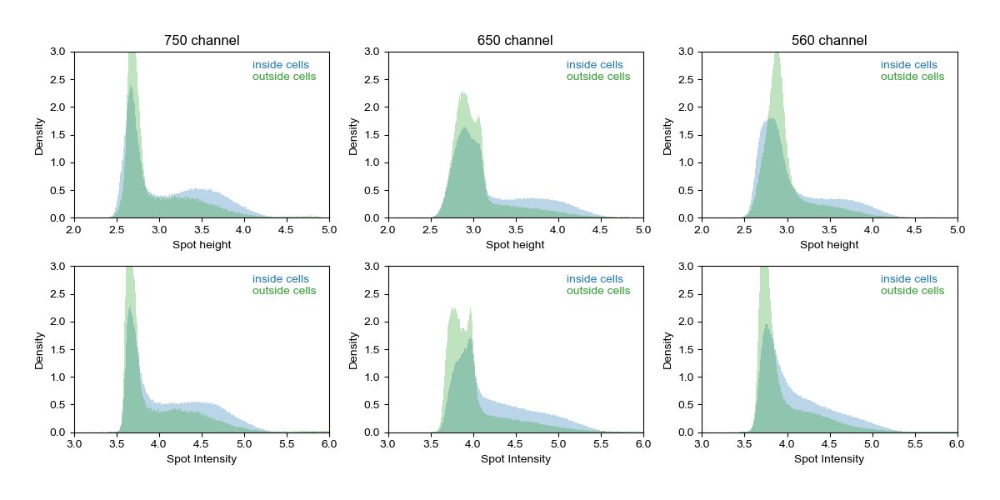

In [72]:
fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(12,6))
ax = np.ravel(ax)

nbins = 500
titles = [750,650,560]
for i in range(3):
    idx_cell = combinedSpotList[i][:,5] == 1
    idx_bg = combinedSpotList[i][:,5] == 2
    height = np.log10(combinedSpotList[i][:,0])
    spot_int = np.log10(combinedSpotList[i][:,3])
    
    xmin = 2 
    xmax = 5
    
    ax[i].hist(height[idx_cell], bins=nbins, range=(xmin,xmax),color='C0',alpha=0.3,density=True)
    ax[i].hist(height[idx_bg], bins=nbins, range=(xmin,xmax),color='C2',alpha=0.3,density=True)
    ax[i].set_xlabel('Spot height')
    ax[i].set_ylabel('Density')
    ax[i].text(0.7, 0.9,'inside cells',c='C0',transform=ax[i].transAxes)
    ax[i].text(0.7, 0.83,'outside cells',c='C2',transform=ax[i].transAxes)
    ax[i].set_title(f'{titles[i]} channel')
    ax[i].axis([xmin,xmax,0,3])
    
    xmin = 3 
    xmax = 6
    
    ax[i+3].hist(spot_int[idx_cell], bins=nbins, range=(3,6),color='C0',alpha=0.3,density=True)
    ax[i+3].hist(spot_int[idx_bg], bins=nbins, range=(3,6),color='C2',alpha=0.3,density=True)
    ax[i+3].set_xlabel('Spot Intensity')
    ax[i+3].set_ylabel('Density')
    ax[i+3].text(0.7, 0.9,'inside cells',c='C0',transform=ax[i+3].transAxes)
    ax[i+3].text(0.7, 0.83,'outside cells',c='C2',transform=ax[i+3].transAxes)
    ax[i+3].axis([xmin,xmax,0,3])
    
fig.tight_layout(pad=3,w_pad=1,h_pad=1)  # otherwise the right y-label is slightly clipped
plt.show()
fig.savefig(f'j{expName}_15_{expDate}.png')

<IPython.core.display.Javascript object>


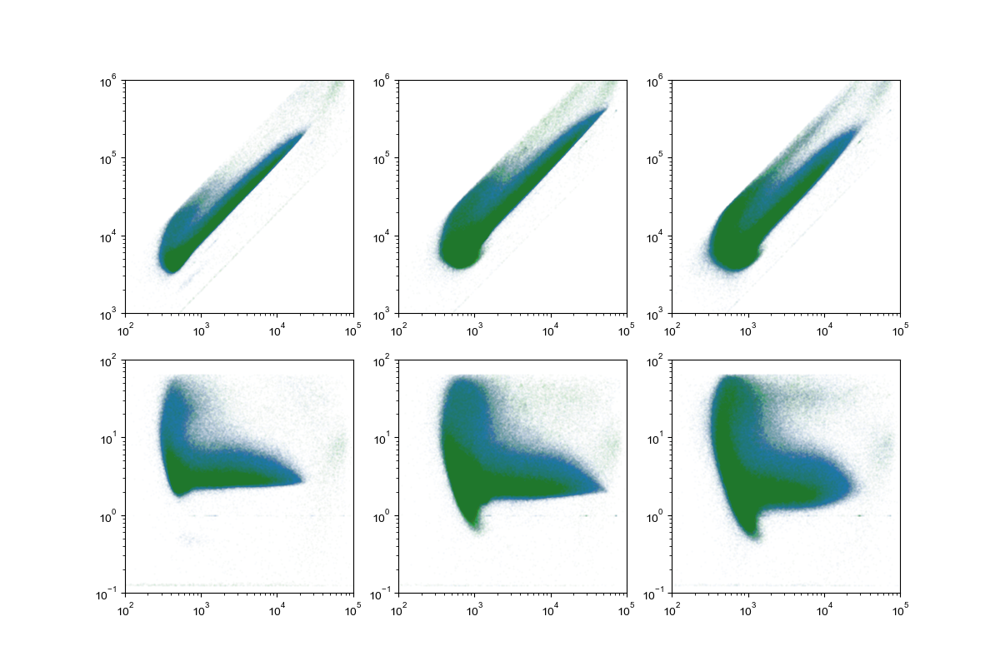

In [124]:
fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(12,8))
ax = np.ravel(ax)

for i in range(3):
    idx_cell = combinedSpotList[i][:,5] == 1
    idx_bg = combinedSpotList[i][:,5] == 2
    
    spot_int = combinedSpotList[i][:,3]
    height = combinedSpotList[i][:,0]
    ax[i].plot(height[idx_cell], spot_int[idx_cell], 'o',color='C0',alpha=0.01,ms=1)
    ax[i].plot(height[idx_bg ], spot_int[idx_bg ],'o',color='C2',alpha=0.01,ms=1)
    ax[i].set_xscale('log')
    ax[i].set_yscale('log')
    ax[i].axis([1e2,1e5,1e3,1e6])
    
    volume = combinedSpotList[i][:,4]
    height = combinedSpotList[i][:,0]
    ax[i+3].plot(height[idx_cell], volume[idx_cell], 'o',color='C0',alpha=0.01,ms=1)
    ax[i+3].plot(height[idx_bg ], volume[idx_bg ],'o',color='C2',alpha=0.01,ms=1)
    ax[i+3].set_xscale('log')
    ax[i+3].set_yscale('log')
    ax[i+3].axis([1e2,1e5,1e-1,1e2])

fig.savefig(f'j{expName}_16_{expDate}.png')

Ok, now, let's calculate the number of spots per cell. We'll use 4 measurements:

    - total cell area 
    - total spots inside the cell
    - total number of spots above a particular threshold inside the cell
    - sum of spot heights in the cell. 

In [77]:
baseFolder = 'g:/analysis/CNVs/CNV002/'

for fov in range(70):
    maskFilePath = f'{baseFolder}cellpose/mask_{fov:02d}.npy'
    mask = np.load(maskFilePath)
    
    cellIDs = np.unique(mask)
    cellIDs = cellIDs[1:]
    for cell_id in range(cellIDs.size):
       
        contourFileName = f'{baseFolder}cell_contours/contour_{fov}_{cellIDs[cell_id]}.npy'
        if not  os.path.isfile(contourFileName):
            
             # find cell coordinates 
            x,y = np.where(mask == cellIDs[cell_id])
            
            # do not consider cells within 10 pixels from the border
            if not (np.any(np.concatenate((x,y)) <10) or np.any(np.concatenate((x,y)) >2038)):

                # calculate cell contour
                contour, hierarchy  = cv2.findContours(np.uint8(mask == cellIDs[cell_id]), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)    
                np.save(outputFile,contour[0])
                print(f'{contourFileName } created',end='\r')
        else:
            print(f'{contourFileName } already exists, skipping.',end='\r')

In [102]:
dapiFile = f'{baseFolder}cellTotalDapi.npy'
if not os.path.isfile(dapiFile):
    print(f'calculating cellTotalDapi ...')
    cellTotalDapi = np.zeros((70,100))
    for fov in range(70):
        print(f'   fov = {fov}',end='\r')
        maskFilePath = f'{baseFolder}cellpose/mask_{fov:02d}.npy'
        mask = np.load(maskFilePath)

        imageStack = dr.DaxReader( f'{remoteFolder}H0R0/Conv_zscan_{fov:02d}.dax')
        dapiImage = imageStack.loadAFrame(139)

        cellIDs = np.unique(mask)
        cellIDs = cellIDs[1:]
        for cell_id in range(cellIDs.size):
            
             # find cell coordinates 
            x,y = np.where(mask == cellIDs[cell_id])
            
            # do not consider cells within 10 pixels from the border
            if not (np.any(np.concatenate((x,y)) <10) or np.any(np.concatenate((x,y)) >2038)):

                # calculate the total dapi signal inside the cell
                cellTotalDapi[fov,cellIDs[cell_id]] = sum(dapiImage[mask==cellIDs[cell_id]])
     
    np.save(dapiFile,cellTotalDapi)
    print(f'\nsaving {dapiFile } ...')
else:
    cellTotalDapi = np.load(dapiFile)
    print(f'reading {dapiFile } ...')
        

reading g:/analysis/CNVs/CNV002/cellTotalDapi.npy ...


let's verify that I can assing spots to  cells. 

In [173]:
f'{remoteFolder}H1R1/Conv_zscan_00.dax'

'w:/20190627_IMR90_CTP05_DNA/H1R1/Conv_zscan_00.dax'

<IPython.core.display.Javascript object>


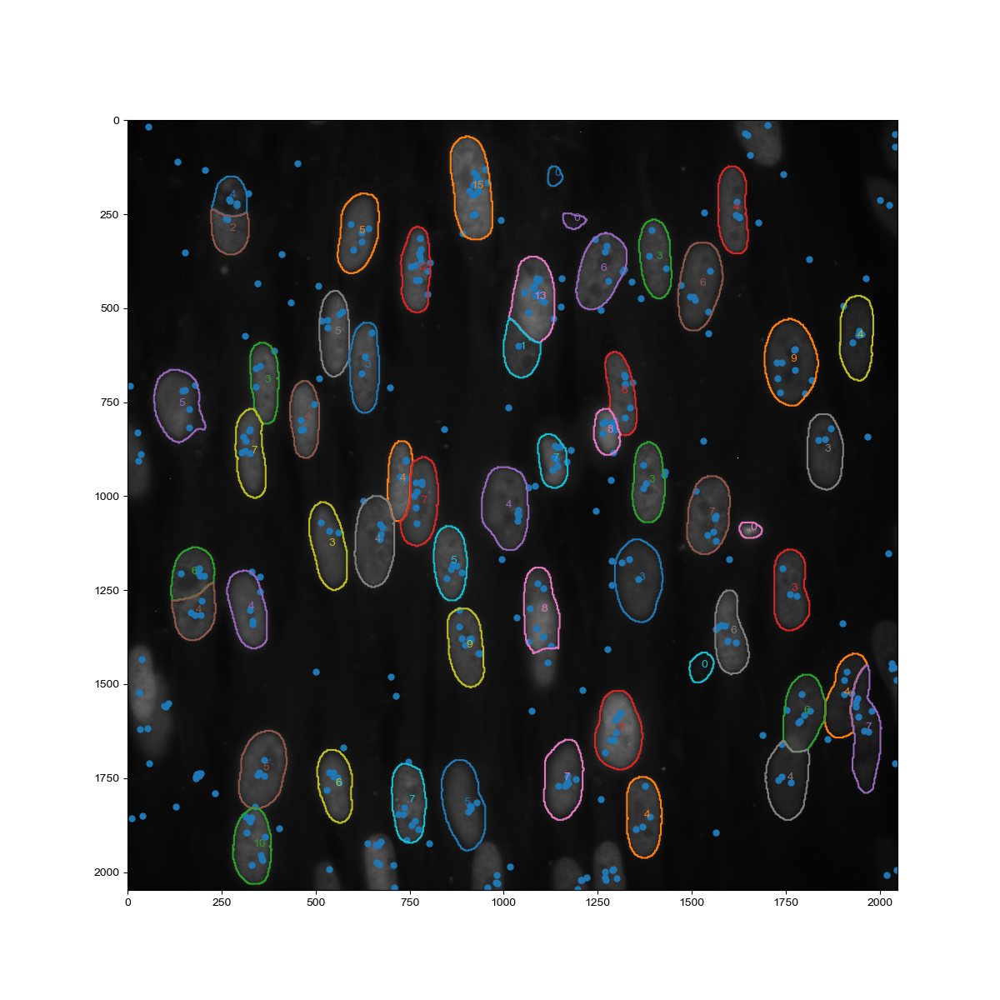

In [201]:
mask = np.load('g:/analysis/CNVs/CNV002/cellpose/mask_00.npy')
imageStack = dr.DaxReader( f'{remoteFolder}H0R0/Conv_zscan_00.dax')
I = imageStack.loadAFrame(139)
spots = np.load(f'g:/analysis/CNVs/CNV002/spots/H1R1_Conv_zscan_00_0.npy')
contourFileName = 'g:/analysis/CNVs/CNV002/cell_contours/contour_0_10.npy'

               
fig,ax = plt.subplots(nrows=1,ncols=1,figsize=(12,12))

ax.imshow(I,vmin=0,vmax=10000,cmap='gray')
ax.plot(spots[:,3],spots[:,2],'o',ms=5)

# get the contours
fov = 0
contourFileList = os.listdir('g:/analysis/CNVs/CNV002/cell_contours/')
contourFileList = [c for c in contourFileList if int(c.split('_')[1]) == fov]

for j in range(len(contourFileList)):
    contour = np.load(f'{baseFolder}cell_contours/{contourFileList[j]}')
    contour = contour.squeeze()
    x = contour[:,0]
    y = contour[:,1]
    p = ax.plot(x,y)
    mx = x.mean() 
    my = y.mean()
    color = p[0].get_color()
#     ax.text(mx,my,f'{j}',color=color)
    
    indexes = []
    for spot_idx in range(spots.shape[0]):
        y = spots[spot_idx,2]
        x = spots[spot_idx,3]
        result = cv2.pointPolygonTest(contour, (x,y), False) 
        if result == 1 or result == 0:
            indexes.append(spot_idx)
    ax.text(mx,my,f'{len(indexes)}',color=color)


Ok, it gets what I want. 

In [202]:
# For each channel,
for channel in range(3):
    peakThresh = [1000,2137,2137]
    for hyb in range(1,47,1):
        
        cell_fov   = []
        cell_ids   = []
        cell_area  = []
        cell_dapi  = []
        tot_spots  = []
        tot_above  = []
        tot_height = []
        
        # check that the file has not been made before. 
        
        # Only analyze rounds with 750, 650 and 560 channels
        if not any(colorUsageDF.iloc[hyb,1:4].isna()):
        
            fileName = f'{baseFolder}cell_info/H{hyb}R{hyb}_{channel}.csv'
            if not os.path.isfile(fileName):        
                for fov in range(70):

                    # read spot file
                    spots = np.load(f'{baseFolder}spots/H{hyb}R{hyb}_Conv_zscan_{fov:02d}_{channel}.npy')

                    # get the contours
                    contourFileList = os.listdir('g:/analysis/CNVs/CNV002/cell_contours/')
                    contourFileList = [c for c in contourFileList if int(c.split('_')[1]) == fov]

                    for file_num in range(len(contourFileList)):

                        cell_id = int(re.split(r'[_.]',contourFileList[file_num])[2])

                        # read cell contour
                        contourFileName = f'{baseFolder}cell_contours/{contourFileList[file_num]}'
                        if os.path.isfile(contourFileName):
                            contour = np.load(contourFileName)
                            cell_area.append(cv2.contourArea(contour))

                            # get indexes of spots that are inside the cell
                            indexes = []
                            for spot_idx in range(spots.shape[0]):
                                y = spots[spot_idx,2]
                                x = spots[spot_idx,3]
                                result = cv2.pointPolygonTest(contour, (x,y), False) 
                                if result == 1 or result == 0:
                                    indexes.append(spot_idx)

                            # calculate features
                            tot_spots.append(len(indexes))
                            tot_above.append(sum(spots[indexes,0] > peakThresh[channel]))
                            tot_height.append(sum(spots[indexes,0]))
                            cell_ids.append(cell_id)
                            cell_fov.append(fov)   
                            cell_dapi.append(cellTotalDapi[fov,cell_id] )

                df = pd.DataFrame({'fov':cell_fov, 'cell_id':cell_ids, 'cell_area':cell_area, 'cell_dapi':cell_dapi, 'tot_spots':tot_spots, 'tot_over_thresh':tot_above, 'tot_height':tot_height})
                df.to_csv(fileName)
                print(f'{fileName} created.')#,end='\r')
            else:
                print(f'{fileName} already exists. Skipping.')#,end='\r')            

g:/analysis/CNVs/CNV002/cell_info/H1R1_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H2R2_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H3R3_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H4R4_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H5R5_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H6R6_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H7R7_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H8R8_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H9R9_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H10R10_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H11R11_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H12R12_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H13R13_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H14R14_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H15R15_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H16R16_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H17R17_0.csv created.
g:/analysis/CNVs/CNV002/cell_info/H18R18_0.csv created.
g:/analysi

let's compare the dapi signal and dapi size. 

<IPython.core.display.Javascript object>


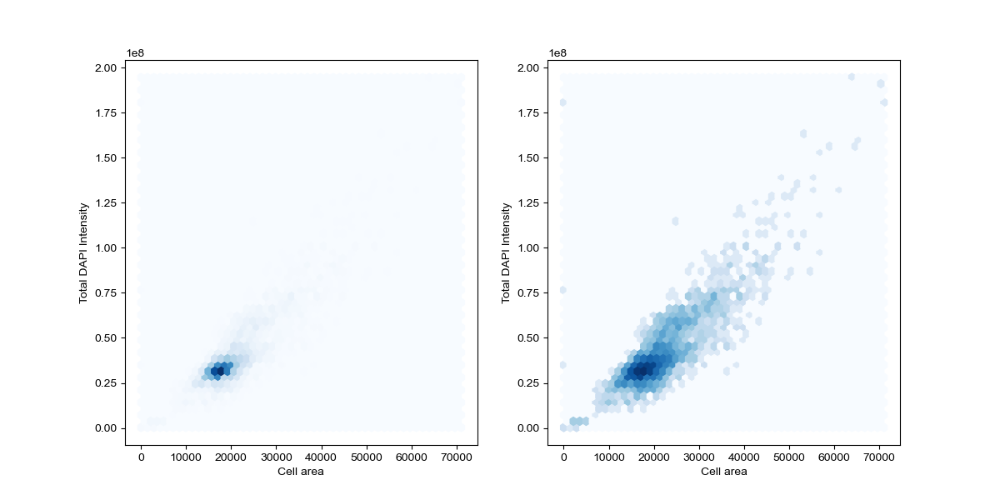

In [125]:
df = pd.read_csv('g:/analysis/CNVs/CNV002/cell_info/H1R1_0.csv')

fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(12,6))

ax[0].hexbin(df.cell_area, df.cell_dapi, gridsize=50,xscale='linear',yscale='linear',cmap=plt.cm.Blues) #extent=(2,5,0,4),
ax[0].set_xlabel('Cell area')
ax[0].set_ylabel('Total DAPI Intensity')

ax[1].hexbin(df.cell_area, df.cell_dapi, gridsize=50,xscale='linear',yscale='linear',cmap=plt.cm.Blues, bins='log') #extent=(2,5,0,4),
ax[1].set_xlabel('Cell area')
ax[1].set_ylabel('Total DAPI Intensity')

fig.savefig(f'j{expName}_17_{expDate}.png')

 ok, let's now take a look at the distribution of cell sizes (code from https://riptutorial.com/scipy/example/31081/fitting-a-function-to-data-from-a-histogram)

In [118]:
# Necessary imports.    
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define fit function.
def fit_function1(x, A, B, mu, sigma):
    return (A * np.exp(-1.0 * (x - mu)**2 / (2 * sigma**2)) + B * np.exp(-1.0 * (x - 2*mu)**2 / (4 * sigma**2)))

# Define fit function.
def fit_function2(x, A, B, mu1, sigma1, mu2, sigma2):
    return (A * np.exp(-1.0 * (x - mu1)**2 / (2 * sigma1**2)) + B * np.exp(-1.0 * (x - mu2)**2 / (2 * sigma2**2)))

# Define fit function.
def fit_function3(x, A, mu, sigma):
    return (A * np.exp(-1.0 * (x - mu)**2 / (2 * sigma**2)))

<IPython.core.display.Javascript object>


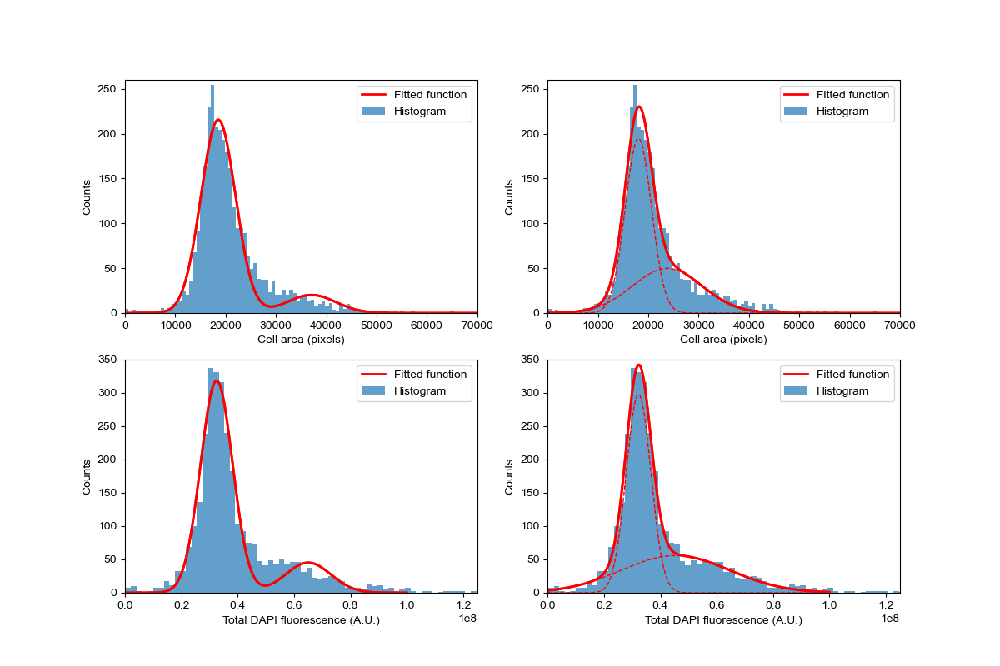

In [205]:
# get histogram of the data Add histograms of exponential and gaussian data.
df = pd.read_csv('g:/analysis/CNVs/CNV002/cell_info/H1R1_0.csv')

fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(12,8))

for data_type in range(2):
    for fit_type in range(2):
        
        if data_type == 0:
            data = df.cell_area
            xlabel = 'Cell area (pixels)'
            p0 = [200, 20, 18000, 1000]
            xspace = np.linspace(0, 70000, 100000)
            axis = [0,70000,0,260]
        else:
            data = df.cell_dapi
            xlabel = 'Total DAPI fluorescence (A.U.)'
            p0 = [350, 40, 3e7, 1e6]
            xspace = np.linspace(0, 1e8, 100000)
            axis = [0,1.25e8,0,350]
            
        bin_counts, bin_edges = np.histogram(data, bins=100)
        bin_centers = np.array([0.5 * (bin_edges[i] + bin_edges[i+1]) for i in range(len(bin_edges)-1)])
        
        if fit_type == 0:
            popt, pcov = curve_fit(fit_function1, xdata=bin_centers, ydata=bin_counts, p0=p0)
            yspace = fit_function1(xspace, *popt)
        else:
            popt, pcov = curve_fit(fit_function2, xdata=bin_centers, ydata=bin_counts, p0=[p0[0],p0[1],p0[2],p0[3],2*p0[2],2*p0[3]])
            yspace = fit_function2(xspace, *popt)

        # Plot the histogram and the fitted function.
        ax[data_type,fit_type].bar(bin_centers, bin_counts, width=bin_centers[1] - bin_centers[0], color='C0', label=r'Histogram',alpha=0.7)
        ax[data_type,fit_type].plot(xspace, yspace, color='r', linewidth=2, label=r'Fitted function')

        # Make the plot nicer.
        ax[data_type,fit_type].axis(axis)
        ax[data_type,fit_type].set_xlabel(xlabel)
        ax[data_type,fit_type].set_ylabel(r'Counts')
        ax[data_type,fit_type].legend(loc='best')
#         ax[data_type,fit_type].bar(bin_centers, bin_counts, width=bin_centers[1] - bin_centers[0], color='C0', label=r'Histogram',alpha=0.5)
        
        if fit_type == 0:
            ax[data_type,fit_type].plot(xspace, fit_function1(xspace, *popt), 'r', linewidth=2, label=r'Fitted function')
        else:
            ax[data_type,fit_type].plot(xspace, fit_function2(xspace, *popt), 'r', linewidth=2, label=r'Fitted function')
            ax[data_type,fit_type].plot(xspace, fit_function3(xspace, *popt[[0,2,3]]), 'r--', linewidth=1, label=r'gaussian 1')
            ax[data_type,fit_type].plot(xspace, fit_function3(xspace, *popt[[1,4,5]]), 'r--', linewidth=1, label=r'gaussian 2')
        
fig.savefig(f'j{expName}_18_{expDate}.png')

<IPython.core.display.Javascript object>


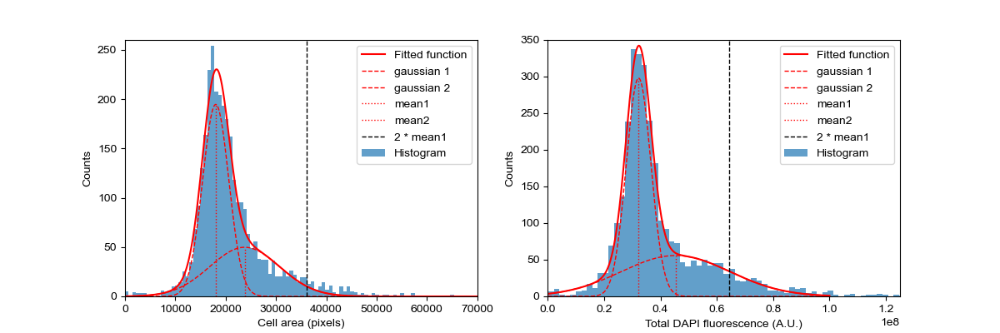

In [206]:
# get histogram of the data Add histograms of exponential and gaussian data.
df = pd.read_csv('g:/analysis/CNVs/CNV002/cell_info/H1R1_0.csv')

fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(12,4))

for data_type in range(2):
    
    if data_type == 0:
        data = df.cell_area
        xlabel = 'Cell area (pixels)'
        p0 = [200, 20, 18000, 1000, 36000, 2000]
        xspace = np.linspace(0, 70000, 100000)
        axis = [0,70000,0,260]
    else:
        data = df.cell_dapi
        xlabel = 'Total DAPI fluorescence (A.U.)'
        p0 = [350, 40, 3e7, 1e6, 6e7, 2e6]
        xspace = np.linspace(0, 1e8, 100000)
        axis = [0,1.25e8,0,350]

    bin_counts, bin_edges = np.histogram(data, bins=100)
    bin_centers = np.array([0.5 * (bin_edges[i] + bin_edges[i+1]) for i in range(len(bin_edges)-1)])
    popt, pcov = curve_fit(fit_function2, xdata=bin_centers, ydata=bin_counts, p0=p0)
    yspace = fit_function2(xspace, *popt)

    # Plot the histogram and the fitted function.
    ax[data_type].bar(bin_centers, bin_counts, width=bin_centers[1] - bin_centers[0], color='C0', label=r'Histogram',alpha=0.7)
    ax[data_type].plot(xspace, yspace, color='r', linewidth=1.5, label=r'Fitted function')
    ax[data_type].plot(xspace, fit_function3(xspace, *popt[[0,2,3]]), 'r--', linewidth=1, label=r'gaussian 1')
    ax[data_type].plot(xspace, fit_function3(xspace, *popt[[1,4,5]]), 'r--', linewidth=1, label=r'gaussian 2')
    ax[data_type].plot([popt[2],popt[2]], [0,popt[0]], 'r:', linewidth=1, label=r'mean1')
    ax[data_type].plot([popt[4],popt[4]], [0,popt[1]], 'r:', linewidth=1, label=r'mean2')
    ax[data_type].plot([2*popt[2],2*popt[2]], [0,axis[3]], 'k--', linewidth=1, label=r'2 * mean1')
    
    ax[data_type].axis(axis)
    ax[data_type].set_xlabel(xlabel)
    ax[data_type].set_ylabel(r'Counts')
    ax[data_type].legend(loc='best')
        
fig.savefig(f'j{expName}_19_{expDate}.png')

Ok, one can fit two distributions, but they do not fit the expected scaling of 2 and 4 Let'2 look DAPI or cell area vs number of spots for a single dataset. Let's check the moving average

In [298]:
def getMovingAverage(X,Y,bin_method=None, data_range=None, n_bins=10, points_per_bin=10):
    
    xx = np.zeros(n_bins)
    xs = np.zeros(n_bins)
    yy = np.zeros(n_bins)
    ys = np.zeros(n_bins)
    n = np.zeros(n_bins)
    
    if bin_method == 'equal_bin_width':
        if data_range:
            x_min, x_max = data_range
        else:
            x_min, x_max = min(X), max(X)
            
        bin_width = (x_max - x_min) / n_bins
        
        for i in range(n_bins):
#             left_border = (x_min + i*bin_width)
#             right_border = (x_min + (i+1)*bin_width)
#             print(f'\n\n{left_border:.0f} - {right_border:.0f}')
            idx = (X >= (x_min + i*bin_width)) & (X < (x_min + (i+1)*bin_width))
#             print(idx)
#             print(f'{X[idx]}->{X[idx].mean()}')
            xx[i] = X[idx].mean()
            xs[i] = X[idx].std()
            yy[i] = Y[idx].mean()
            ys[i] = Y[idx].std()
            n[i]  = sum(idx)
#             print(f'{xx[i]:10.0f}{xs[i]:10.0f}{yy[i]:10.0f}{ys[i]:10.0f}{n[i]:10.0f}')

    elif bin_method == 'equal_sample_size':
        
        # Sort data
        idx = np.argsort(X)
        X_ = X[idx]
        Y_ = Y[idx] 
        
        if data_range
        
    else:
        print('Binning method is not correct')

   return xx, xs, yy, ys, n 

<IPython.core.display.Javascript object>


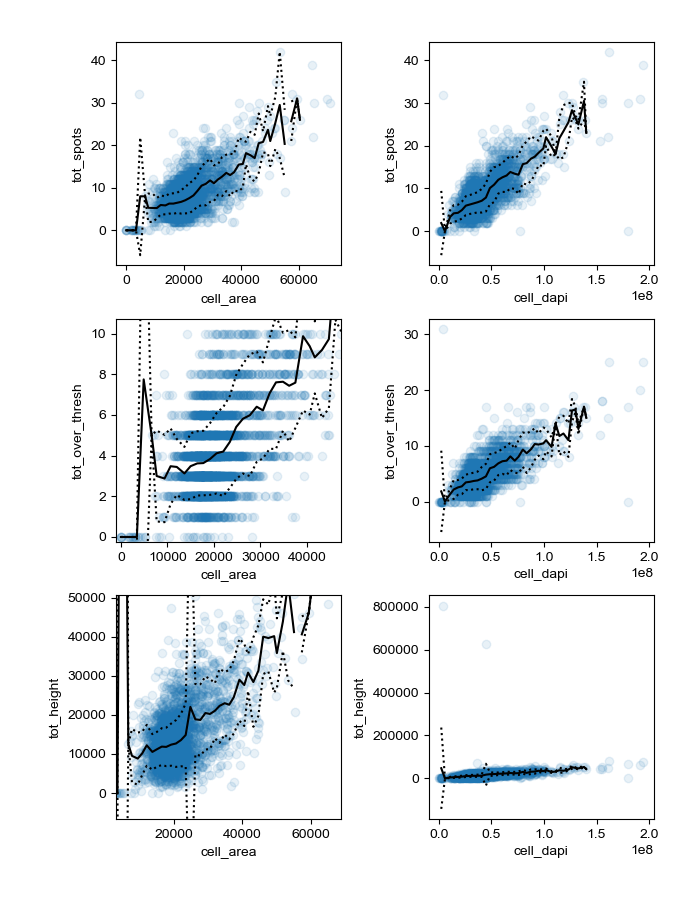

        19        22         0         0         5
      2145       395         0         0         7
      3450       477         0         0         6
      4914       298         8        14         4
      6624         0         8         0         1
      7701       347         5         3        10
      9393       415         5         3        16
     10696       401         5         2        25
     12028       402         6         2        45
     13667       408         6         2       103
     14990       419         6         2       222
     16426       413         6         2       394
     17723       395         6         2       462
     19163       395         7         3       397
     20573       419         7         3       342
     22008       400         8         4       213
     23420       403         8         4       184
     24790       385         9         4       112
     26250       410        11         5        94
     27712       394        11 

<ipython-input-298-3aacf0887609>:24: RuntimeWarning: Mean of empty slice.
  xx[i] = X[idx].mean()
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:194: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-298-3aacf0887609>:26: RuntimeWarning: Mean of empty slice.
  yy[i] = Y[idx].mean()


       nan       nan       nan       nan         0
     64986       304        30         7         3
       nan       nan       nan       nan         0
       nan       nan       nan       nan         0
       nan       nan       nan       nan         0
     69928         0        31         0         1
        19        22         0         0         5
      2145       395         0         0         7
      3450       477         0         0         6
      4914       298         8        13         4
      6624         0         5         0         1
      7701       347         3         2        10
      9393       415         3         2        16
     10696       401         3         2        25
     12028       402         3         1        45
     13667       408         3         1       103
     14990       419         3         2       222
     16426       413         4         2       394
     17723       395         4         2       462
     19163       395         4 

<ipython-input-298-3aacf0887609>:24: RuntimeWarning: Mean of empty slice.
  xx[i] = X[idx].mean()
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:194: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-298-3aacf0887609>:26: RuntimeWarning: Mean of empty slice.
  yy[i] = Y[idx].mean()


      4914       298    201453    348926         4
      6624         0     12544         0         1
      7701       347      9520      6854        10
      9393       415      8823      6665        16
     10696       401     10150      5518        25
     12028       402     12211      5225        45
     13667       408     10525      4549       103
     14990       419     11194      4449       222
     16426       413     11881      4717       394
     17723       395     11806      4923       462
     19163       395     12384      5392       397
     20573       419     12676      5982       342
     22008       400     13530      6687       213
     23420       403     14848      8059       184
     24790       385     22042     57969       112
     26250       410     18862      9013        94
     27712       394     18700      9129        74
     29196       421     20472      9342        59
     30538       425     20234      8957        40
     31965       401     21048 

<ipython-input-298-3aacf0887609>:24: RuntimeWarning: Mean of empty slice.
  xx[i] = X[idx].mean()
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:194: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-298-3aacf0887609>:26: RuntimeWarning: Mean of empty slice.
  yy[i] = Y[idx].mean()


  14255140   1094825         4         2        25
  18282718   1226929         4         2        43
  21966388   1115475         5         2       101
  25769448   1159426         6         2       236
  29624633   1049888         6         2       576
  33238780   1120470         6         2       647
  36955893   1104324         7         2       422
  40921326   1084513         7         3       195
  44869223   1102792         8         3       148
  48665091   1126651        10         4        88
  52594154   1131692        11         4        91
  56637890   1174070        12         3        92
  60535824   1037535        13         3        92
  64558915   1097463        13         4        69
  68100217   1123839        14         4        42
  72258501   1204780        13         4        48
  75840518   1121315        13         5        39
  79961654   1143440        16         4        16
  83575472   1144319        16         5        12
  87657305   1080323        17 

<ipython-input-298-3aacf0887609>:24: RuntimeWarning: Mean of empty slice.
  xx[i] = X[idx].mean()
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:194: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-298-3aacf0887609>:26: RuntimeWarning: Mean of empty slice.
  yy[i] = Y[idx].mean()


 191623571         0        31         0         1
   2379398   1003051         2         7        17
   5924871    981529         0         0         3
  10825860    932287         1         1         9
  14255140   1094825         2         2        25
  18282718   1226929         3         1        43
  21966388   1115475         3         1       101
  25769448   1159426         3         1       236
  29624633   1049888         4         1       576
  33238780   1120470         4         1       647
  36955893   1104324         4         2       422
  40921326   1084513         4         2       195
  44869223   1102792         5         2       148
  48665091   1126651         6         3        88
  52594154   1131692         6         2        91
  56637890   1174070         7         2        92
  60535824   1037535         7         2        92
  64558915   1097463         7         3        69
  68100217   1123839         8         2        42
  72258501   1204780         7 

<ipython-input-298-3aacf0887609>:24: RuntimeWarning: Mean of empty slice.
  xx[i] = X[idx].mean()
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:194: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-298-3aacf0887609>:26: RuntimeWarning: Mean of empty slice.
  yy[i] = Y[idx].mean()


  40921326   1084513     12861      5801       195
  44869223   1102792     17449     50721       148
  48665091   1126651     19512      7678        88
  52594154   1131692     20083      7980        91
  56637890   1174070     21630      5871        92
  60535824   1037535     22168      6496        92
  64558915   1097463     23455      7610        69
  68100217   1123839     24987      5536        42
  72258501   1204780     23706      6592        48
  75840518   1121315     24306      8658        39
  79961654   1143440     30291      8838        16
  83575472   1144319     25607      8465        12
  87657305   1080323     30947     10803        22
  91295631   1043139     31925     10324        16
  94871772    827829     35562      5602         9
  99466961    917892     33634      8749        14
 102028396     87380     38836      7142         2
 107253683    764255     29640      4029         5
 111059010         0     31879         0         1
 114679560    746310     38059 

<ipython-input-298-3aacf0887609>:24: RuntimeWarning: Mean of empty slice.
  xx[i] = X[idx].mean()
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:194: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(
C:\Users\Leonardo\anaconda3\envs\scanpy_env_210121\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
<ipython-input-298-3aacf0887609>:26: RuntimeWarning: Mean of empty slice.
  yy[i] = Y[idx].mean()


In [299]:
# get histogram of the data Add histograms of exponential and gaussian data.
df = pd.read_csv('g:/analysis/CNVs/CNV002/cell_info/H1R1_0.csv')

fig,ax = plt.subplots(nrows=3,ncols=2,figsize=(7,9))

xvar = ['cell_area','cell_dapi']
yvar = ['tot_spots','tot_over_thresh','tot_height']
for i in range(2): 
    X = df[xvar[i]].to_numpy()
    for j in range(3):
        Y = df[yvar[j]].to_numpy()
        
        xx, xs, yy, ys, n = getMovingAverage(X, Y, bin_method='equal_bin_width', n_bins=50)
    
        ax[j,i].plot(X,Y,'o',alpha=0.1)
        ax[j,i].plot(xx,yy,'k-')
        ax[j,i].plot(xx,yy-ys,'k:')
        ax[j,i].plot(xx,yy+ys,'k:')
        ax[j,i].set_xlabel(xvar[i])
        ax[j,i].set_ylabel(yvar[j])
        
fig.tight_layout(pad=3,w_pad=1,h_pad=1)

In [293]:
xx

array([ 17.,   3.,   9.,  25.,  43., 101., 236., 576., 647., 422., 195.,
       148.,  88.,  91.,  92.,  92.,  69.,  42.,  48.,  39.,  16.,  12.,
        22.,  16.,   9.,  14.,   2.,   5.,   1.,   4.,   5.,   2.,   3.,
         2.,   2.,   2.,   1.,   0.,   0.,   3.,   0.,   2.,   0.,   0.,
         0.,   0.,   2.,   0.,   0.,   1.])

In [280]:
xx

array([ 17.,   3.,   9.,  25.,  43., 101., 236., 576., 647., 422., 195.,
       148.,  88.,  91.,  92.,  92.,  69.,  42.,  48.,  39.,  16.,  12.,
        22.,  16.,   9.,  14.,   2.,   5.,   1.,   4.,   5.,   2.,   3.,
         2.,   2.,   2.,   1.,   0.,   0.,   3.,   0.,   2.,   0.,   0.,
         0.,   0.,   2.,   0.,   0.,   1.])

In [267]:
df['cell_area'].sort()

AttributeError: 'Series' object has no attribute 'sort'

In [237]:
xs

array([  5.,   7.,   6.,   4.,   1.,  10.,  16.,  25.,  45., 103., 222.,
       394., 462., 397., 342., 213., 184., 112.,  94.,  74.,  59.,  40.,
        46.,  48.,  33.,  32.,  22.,  24.,  18.,   6.,  15.,  15.,   6.,
         5.,   3.,   3.,   4.,   2.,   3.,   0.,   3.,   1.,   1.,   0.,
         0.,   3.,   0.,   0.,   0.,   1.])

In [216]:
if None:
    print('aaa')

In [157]:
syschk.backupNotebook(destination='C:/Software/python-notebooks-backup')

about creating gif file, from https://stackoverflow.com/questions/753190/programmatically-generate-video-or-animated-gif-in-python

In [ ]:
import glob
from PIL import Image

# filepaths
fp_in = "/path/to/image_*.png"
fp_out = "/path/to/image.gif"

# https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
img, *imgs = [Image.open(f) for f in sorted(glob.glob(fp_in))]
img.save(fp=fp_out, format='GIF', append_images=imgs,
         save_all=True, duration=200, loop=0)

In [ ]:
from PIL import ImageColor
ImageColor.getcolor("#2ca02c", "RGB")/255